# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [7]:
data_dir = '/data'
#!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
#helper.download_extract('celeba', data_dir)
#I download Celeb data manually

Found mnist Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

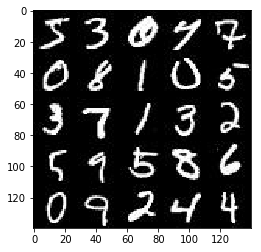

In [77]:
show_n_images = 25

"""``
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

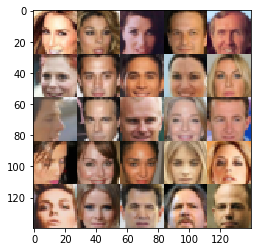

In [78]:
#!pip install matplotlib==2.0.2
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [14]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.11.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [15]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels) ,name = 'real_inputs')
    z_input = tf.placeholder(tf.float32, (None, z_dim), name = 'z_input')
    learning_rate = tf.placeholder(tf.float32, name = 'learning_rate')
    return real_inputs, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [123]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    #images dimension: 28x28x(1 or 3)
    alpha = 0.3
    # TODO: Implement Function
    with tf.variable_scope("discriminator", reuse = reuse):
        x1 = tf.layers.conv2d(images, filters = 64, kernel_size  = 5, strides  = 2, padding  = 'same')
        x1 = tf.maximum(x1, x1*0.2)

        x2  = tf.layers.conv2d(x1, filters  = 128, kernel_size = 5, strides = 2, padding = 'same')
        x2 = tf.layers.batch_normalization(x2, training = True)
        x2 = tf.maximum(x2, x2*0.2)
        x2 = tf.layers.dropout(x2, 0.2)
        
        x3 = tf.layers.conv2d(x2, filters = 256, kernel_size = 5, strides = 2, padding = 'same')
        x3 = tf.layers.batch_normalization(x3, training = True)
        x3 = tf.maximum(x3, x3*0.2)
        x3 = tf.layers.dropout(x3, 0.2)
        
        x4 = tf.layers.conv2d(x3, filters = 1024, kernel_size = 5, strides  =1, padding = 'same')
        x4 = tf.layers.batch_normalization(x4, training = True)
        x4 = tf.maximum(x4, x4*0.2)
        x4 = tf.layers.dropout(x4,0.2)
        
        flatten = tf.reshape(x4, (-1,4*4*1024))
        logits = tf.layers.dense(flatten, 1)
        output = tf.sigmoid(logits)
        
        return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [121]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    std = 0.2
    with tf.variable_scope("generator", reuse = (not is_train)):
        x1 = tf.layers.dense(z, 2*2*1024, kernel_initializer = tf.truncated_normal_initializer(stddev=std))
        x1 = tf.reshape(x1, (-1, 2, 2, 1024))
        x1 = tf.layers.batch_normalization(x1, training = is_train)
        x1 = tf.maximum(x1, x1*0.06)
        
        x2 = tf.layers.conv2d_transpose(x1, 512, kernel_size = 5, strides = 2, padding = 'valid', kernel_initializer = tf.truncated_normal_initializer(stddev=std))
        x2 = tf.layers.batch_normalization(x2, training = is_train)
        x2 = tf.maximum(x2, x2*0.06)
        
        x3 = tf.layers.conv2d_transpose(x2, 256, kernel_size = 5, strides = 2, padding = 'same', kernel_initializer = tf.truncated_normal_initializer(stddev=std))
        x3 = tf.layers.batch_normalization(x3, training = is_train)
        x3 = tf.maximum(x3, x3*0.06)
        
        x4 = tf.layers.conv2d_transpose(x3, 128, kernel_size = 5, strides = 1, padding = 'same', kernel_initializer = tf.truncated_normal_initializer(stddev=std))
        x4 = tf.layers.batch_normalization(x4, training = is_train)
        x4 = tf.maximum(x4, x4*0.06)
        
        x5 = tf.layers.conv2d_transpose(x4, 64, kernel_size = 5, strides = 1, padding = 'same', kernel_initializer = tf.truncated_normal_initializer(stddev=std))
        x5 = tf.layers.batch_normalization(x5, training = is_train)
        x5 = tf.maximum(x5, x5*0.2)
        
        x6 = tf.layers.conv2d_transpose(x5, 32, kernel_size = 5, strides = 1, padding = 'same', kernel_initializer = tf.truncated_normal_initializer(stddev=std))
        x6 =tf.layers.batch_normalization(x6, training = is_train)
        x6 = tf.maximum(x6,x6*0.06)

        x7 = tf.layers.conv2d_transpose(x6, 16, kernel_size = 5, strides = 1, padding = 'same', kernel_initializer = tf.truncated_normal_initializer(stddev=std))
        x7 = tf.layers.batch_normalization(x7, training = is_train)
        x7 = tf.maximum(x7, x7*0.06)
        
        logits = tf.layers.conv2d_transpose(x7, out_channel_dim, kernel_size = 5, strides = 2, padding = 'same', kernel_initializer = tf.truncated_normal_initializer(stddev=std))
        output = tf.tanh(logits)
        
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [33]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real_sigmoid, d_model_real_logits  = discriminator(input_real)
    d_model_fake_sigmoid, d_model_fake_logits  = discriminator(g_model, reuse = True)
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_model_fake_logits, labels = tf.ones_like(d_model_fake_logits)*0.99))
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_model_real_logits, labels = tf.ones_like(d_model_real_logits)*0.99))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_model_fake_logits, labels = tf.zeros_like(d_model_fake_logits)))
    
    d_loss = d_loss_real + d_loss_fake
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [24]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    all_variables = tf.trainable_variables()
    d_vars = [var for var in all_variables if var.name.startswith('discriminator')]
    g_vars = [var for var in all_variables if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list = d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list = g_vars)
    
#     ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
#     g_updates = [opt for opt in ops if opt.name.startswith('generator')]
#     with tf.control_dependencies(g_updates):
#         g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)


    
    return d_train_opt, g_train_opt
        
    
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [114]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [117]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #saver = tf.train.Saver()
    #sample_z = np.random.uniform(-1, 1 ,size=(batch_size, z_dim))
    _, img_width, img_height, img_channels = data_shape
    input_real, input_z, lr = model_inputs(img_width, img_height, img_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, img_channels)
    
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    
    steps = 0
    print_every = 10
    show_every = 50
    losses = []
    n_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1,1, size = (batch_size, z_dim))
                
                #run optimizers
                _ = sess.run(d_opt, feed_dict = {input_real: batch_images, input_z: batch_z, lr : learning_rate})
                _ = sess.run(g_opt, feed_dict = {input_real: batch_images, input_z: batch_z, lr : learning_rate})
                
                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Step {}...".format(steps),
                          "Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    losses.append([train_loss_d, train_loss_g])
                if steps % 100 == 0:   
                    show_generator_output(sess, n_images, input_z, img_channels, data_image_mode)
                    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Step 10... Epoch 1/6... Discriminator Loss: 19.4040... Generator Loss: 88.4209
Step 20... Epoch 1/6... Discriminator Loss: 44.5301... Generator Loss: 0.4413
Step 30... Epoch 1/6... Discriminator Loss: 5.5943... Generator Loss: 0.0978
Step 40... Epoch 1/6... Discriminator Loss: 2.2711... Generator Loss: 2.5206
Step 50... Epoch 1/6... Discriminator Loss: 0.6510... Generator Loss: 4.1794
Step 60... Epoch 1/6... Discriminator Loss: 5.1757... Generator Loss: 0.3241
Step 70... Epoch 1/6... Discriminator Loss: 2.5673... Generator Loss: 8.5975
Step 80... Epoch 1/6... Discriminator Loss: 1.9724... Generator Loss: 8.3360
Step 90... Epoch 1/6... Discriminator Loss: 3.0664... Generator Loss: 1.0955
Step 100... Epoch 1/6... Discriminator Loss: 1.6061... Generator Loss: 5.8108


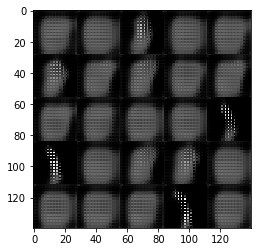

Step 110... Epoch 1/6... Discriminator Loss: 0.1943... Generator Loss: 4.1180
Step 120... Epoch 1/6... Discriminator Loss: 5.2358... Generator Loss: 0.0585
Step 130... Epoch 1/6... Discriminator Loss: 0.1899... Generator Loss: 5.7509
Step 140... Epoch 1/6... Discriminator Loss: 12.9242... Generator Loss: 28.4886
Step 150... Epoch 1/6... Discriminator Loss: 0.0967... Generator Loss: 4.7716
Step 160... Epoch 1/6... Discriminator Loss: 0.3008... Generator Loss: 7.8234
Step 170... Epoch 1/6... Discriminator Loss: 0.1991... Generator Loss: 4.7108
Step 180... Epoch 1/6... Discriminator Loss: 0.7911... Generator Loss: 4.8453
Step 190... Epoch 1/6... Discriminator Loss: 6.1448... Generator Loss: 25.4348
Step 200... Epoch 1/6... Discriminator Loss: 3.8241... Generator Loss: 0.0747


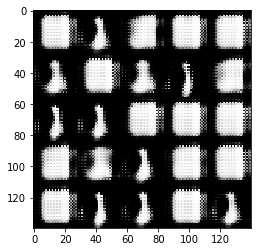

Step 210... Epoch 1/6... Discriminator Loss: 0.2401... Generator Loss: 3.8550
Step 220... Epoch 1/6... Discriminator Loss: 0.8883... Generator Loss: 9.2975
Step 230... Epoch 1/6... Discriminator Loss: 0.2946... Generator Loss: 4.4950
Step 240... Epoch 1/6... Discriminator Loss: 0.1454... Generator Loss: 3.0727
Step 250... Epoch 1/6... Discriminator Loss: 1.2958... Generator Loss: 3.5586
Step 260... Epoch 1/6... Discriminator Loss: 0.2004... Generator Loss: 2.7560
Step 270... Epoch 1/6... Discriminator Loss: 0.6112... Generator Loss: 7.1287
Step 280... Epoch 1/6... Discriminator Loss: 0.1255... Generator Loss: 4.1603
Step 290... Epoch 1/6... Discriminator Loss: 0.2124... Generator Loss: 2.7618
Step 300... Epoch 1/6... Discriminator Loss: 0.9014... Generator Loss: 4.1825


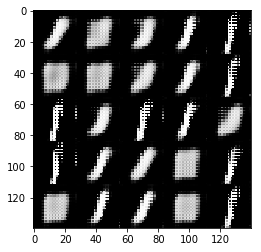

Step 310... Epoch 1/6... Discriminator Loss: 0.8333... Generator Loss: 2.5410
Step 320... Epoch 1/6... Discriminator Loss: 0.3403... Generator Loss: 2.4777
Step 330... Epoch 1/6... Discriminator Loss: 0.4662... Generator Loss: 3.3654
Step 340... Epoch 1/6... Discriminator Loss: 0.5673... Generator Loss: 4.2551
Step 350... Epoch 1/6... Discriminator Loss: 0.5493... Generator Loss: 2.3952
Step 360... Epoch 1/6... Discriminator Loss: 0.4101... Generator Loss: 3.2300
Step 370... Epoch 1/6... Discriminator Loss: 2.2964... Generator Loss: 1.2310
Step 380... Epoch 1/6... Discriminator Loss: 1.2055... Generator Loss: 0.6716
Step 390... Epoch 1/6... Discriminator Loss: 0.4321... Generator Loss: 1.7563
Step 400... Epoch 1/6... Discriminator Loss: 3.3396... Generator Loss: 5.4526


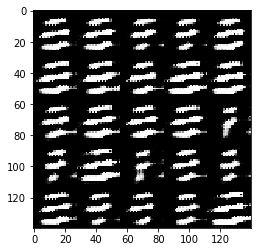

Step 410... Epoch 1/6... Discriminator Loss: 0.6799... Generator Loss: 1.8247
Step 420... Epoch 1/6... Discriminator Loss: 0.3880... Generator Loss: 2.7425
Step 430... Epoch 1/6... Discriminator Loss: 0.4382... Generator Loss: 1.5447
Step 440... Epoch 1/6... Discriminator Loss: 0.4368... Generator Loss: 1.9452
Step 450... Epoch 1/6... Discriminator Loss: 0.9803... Generator Loss: 1.6256
Step 460... Epoch 1/6... Discriminator Loss: 0.7509... Generator Loss: 2.9336
Step 470... Epoch 1/6... Discriminator Loss: 2.3465... Generator Loss: 6.0318
Step 480... Epoch 1/6... Discriminator Loss: 0.8273... Generator Loss: 1.0961
Step 490... Epoch 1/6... Discriminator Loss: 1.1540... Generator Loss: 0.8570
Step 500... Epoch 1/6... Discriminator Loss: 0.5630... Generator Loss: 1.8675


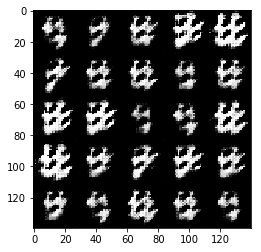

Step 510... Epoch 1/6... Discriminator Loss: 0.6111... Generator Loss: 7.9482
Step 520... Epoch 1/6... Discriminator Loss: 0.3706... Generator Loss: 2.4404
Step 530... Epoch 1/6... Discriminator Loss: 0.5305... Generator Loss: 2.1645
Step 540... Epoch 1/6... Discriminator Loss: 1.5750... Generator Loss: 0.4386
Step 550... Epoch 1/6... Discriminator Loss: 1.0791... Generator Loss: 5.3830
Step 560... Epoch 1/6... Discriminator Loss: 1.8802... Generator Loss: 3.7751
Step 570... Epoch 1/6... Discriminator Loss: 0.9268... Generator Loss: 1.0616
Step 580... Epoch 1/6... Discriminator Loss: 0.2755... Generator Loss: 2.8035
Step 590... Epoch 1/6... Discriminator Loss: 0.5595... Generator Loss: 1.4448
Step 600... Epoch 1/6... Discriminator Loss: 0.3745... Generator Loss: 2.1345


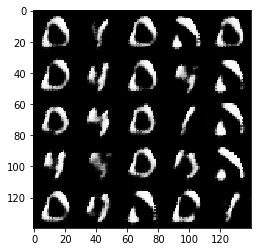

Step 610... Epoch 2/6... Discriminator Loss: 1.1875... Generator Loss: 3.5257
Step 620... Epoch 2/6... Discriminator Loss: 2.2148... Generator Loss: 6.4914
Step 630... Epoch 2/6... Discriminator Loss: 0.6027... Generator Loss: 1.3949
Step 640... Epoch 2/6... Discriminator Loss: 1.0422... Generator Loss: 1.1152
Step 650... Epoch 2/6... Discriminator Loss: 0.5202... Generator Loss: 2.0829
Step 660... Epoch 2/6... Discriminator Loss: 0.6420... Generator Loss: 1.9038
Step 670... Epoch 2/6... Discriminator Loss: 0.6543... Generator Loss: 2.2477
Step 680... Epoch 2/6... Discriminator Loss: 0.6014... Generator Loss: 1.8702
Step 690... Epoch 2/6... Discriminator Loss: 1.0468... Generator Loss: 1.7970
Step 700... Epoch 2/6... Discriminator Loss: 0.3561... Generator Loss: 2.5656


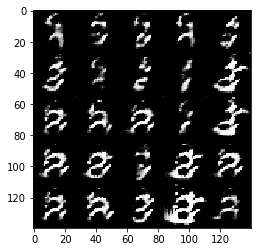

Step 710... Epoch 2/6... Discriminator Loss: 0.2302... Generator Loss: 3.2263
Step 720... Epoch 2/6... Discriminator Loss: 0.8512... Generator Loss: 1.2399
Step 730... Epoch 2/6... Discriminator Loss: 1.0719... Generator Loss: 3.1646
Step 740... Epoch 2/6... Discriminator Loss: 0.7024... Generator Loss: 1.7938
Step 750... Epoch 2/6... Discriminator Loss: 0.4863... Generator Loss: 1.7180
Step 760... Epoch 2/6... Discriminator Loss: 0.7074... Generator Loss: 1.4789
Step 770... Epoch 2/6... Discriminator Loss: 0.7717... Generator Loss: 1.3790
Step 780... Epoch 2/6... Discriminator Loss: 0.7393... Generator Loss: 1.2431
Step 790... Epoch 2/6... Discriminator Loss: 0.8851... Generator Loss: 1.1897
Step 800... Epoch 2/6... Discriminator Loss: 0.6725... Generator Loss: 1.1644


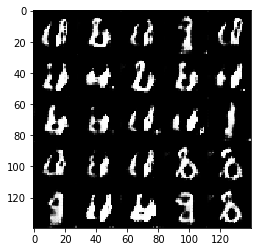

Step 810... Epoch 2/6... Discriminator Loss: 0.4361... Generator Loss: 1.7128
Step 820... Epoch 2/6... Discriminator Loss: 0.7969... Generator Loss: 1.2470
Step 830... Epoch 2/6... Discriminator Loss: 0.5824... Generator Loss: 2.1943
Step 840... Epoch 2/6... Discriminator Loss: 0.9037... Generator Loss: 1.6711
Step 850... Epoch 2/6... Discriminator Loss: 0.9353... Generator Loss: 2.8948
Step 860... Epoch 2/6... Discriminator Loss: 0.5661... Generator Loss: 1.7674
Step 870... Epoch 2/6... Discriminator Loss: 2.9207... Generator Loss: 0.2095
Step 880... Epoch 2/6... Discriminator Loss: 0.9541... Generator Loss: 1.1843
Step 890... Epoch 2/6... Discriminator Loss: 0.7276... Generator Loss: 1.1614
Step 900... Epoch 2/6... Discriminator Loss: 3.1384... Generator Loss: 6.7764


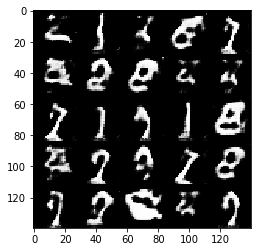

Step 910... Epoch 2/6... Discriminator Loss: 0.9818... Generator Loss: 1.9939
Step 920... Epoch 2/6... Discriminator Loss: 0.6272... Generator Loss: 1.8732
Step 930... Epoch 2/6... Discriminator Loss: 0.8065... Generator Loss: 1.1648
Step 940... Epoch 2/6... Discriminator Loss: 2.9122... Generator Loss: 5.6334
Step 950... Epoch 2/6... Discriminator Loss: 0.8483... Generator Loss: 1.0714
Step 960... Epoch 2/6... Discriminator Loss: 0.5941... Generator Loss: 1.5435
Step 970... Epoch 2/6... Discriminator Loss: 1.2260... Generator Loss: 0.6503
Step 980... Epoch 2/6... Discriminator Loss: 0.8998... Generator Loss: 1.9604
Step 990... Epoch 2/6... Discriminator Loss: 0.8203... Generator Loss: 1.0976
Step 1000... Epoch 2/6... Discriminator Loss: 0.7954... Generator Loss: 1.3922


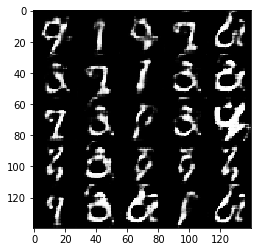

Step 1010... Epoch 2/6... Discriminator Loss: 0.7100... Generator Loss: 2.5745
Step 1020... Epoch 2/6... Discriminator Loss: 0.5004... Generator Loss: 1.8077
Step 1030... Epoch 2/6... Discriminator Loss: 0.5267... Generator Loss: 1.8697
Step 1040... Epoch 2/6... Discriminator Loss: 0.5398... Generator Loss: 1.6263
Step 1050... Epoch 2/6... Discriminator Loss: 1.0117... Generator Loss: 1.1262
Step 1060... Epoch 2/6... Discriminator Loss: 1.0007... Generator Loss: 0.9731
Step 1070... Epoch 2/6... Discriminator Loss: 0.4709... Generator Loss: 2.2760
Step 1080... Epoch 2/6... Discriminator Loss: 0.7510... Generator Loss: 1.2629
Step 1090... Epoch 2/6... Discriminator Loss: 1.2638... Generator Loss: 4.3578
Step 1100... Epoch 2/6... Discriminator Loss: 1.1565... Generator Loss: 0.9032


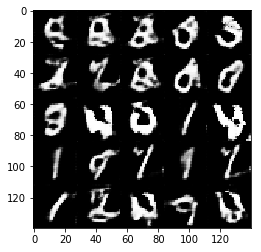

Step 1110... Epoch 2/6... Discriminator Loss: 0.6071... Generator Loss: 1.3411
Step 1120... Epoch 2/6... Discriminator Loss: 0.4219... Generator Loss: 2.3230
Step 1130... Epoch 2/6... Discriminator Loss: 0.6396... Generator Loss: 1.9622
Step 1140... Epoch 2/6... Discriminator Loss: 0.9750... Generator Loss: 1.2991
Step 1150... Epoch 2/6... Discriminator Loss: 0.6395... Generator Loss: 1.5975
Step 1160... Epoch 2/6... Discriminator Loss: 0.8606... Generator Loss: 1.2821
Step 1170... Epoch 2/6... Discriminator Loss: 0.5112... Generator Loss: 1.4148
Step 1180... Epoch 2/6... Discriminator Loss: 0.5496... Generator Loss: 1.4795
Step 1190... Epoch 2/6... Discriminator Loss: 0.4654... Generator Loss: 2.7939
Step 1200... Epoch 2/6... Discriminator Loss: 0.4109... Generator Loss: 1.9009


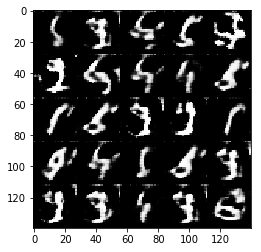

Step 1210... Epoch 3/6... Discriminator Loss: 1.0368... Generator Loss: 0.7036
Step 1220... Epoch 3/6... Discriminator Loss: 0.6189... Generator Loss: 1.4717
Step 1230... Epoch 3/6... Discriminator Loss: 0.8057... Generator Loss: 1.4183
Step 1240... Epoch 3/6... Discriminator Loss: 0.9460... Generator Loss: 1.4739
Step 1250... Epoch 3/6... Discriminator Loss: 0.8009... Generator Loss: 2.0005
Step 1260... Epoch 3/6... Discriminator Loss: 0.8514... Generator Loss: 1.3040
Step 1270... Epoch 3/6... Discriminator Loss: 0.9235... Generator Loss: 0.8152
Step 1280... Epoch 3/6... Discriminator Loss: 0.8488... Generator Loss: 1.6404
Step 1290... Epoch 3/6... Discriminator Loss: 1.0435... Generator Loss: 0.7053
Step 1300... Epoch 3/6... Discriminator Loss: 0.7824... Generator Loss: 1.2094


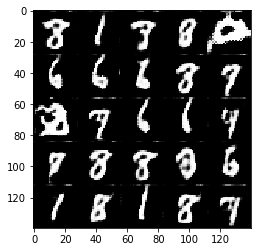

Step 1310... Epoch 3/6... Discriminator Loss: 0.9319... Generator Loss: 0.8528
Step 1320... Epoch 3/6... Discriminator Loss: 0.5820... Generator Loss: 1.5195
Step 1330... Epoch 3/6... Discriminator Loss: 1.5182... Generator Loss: 0.5122
Step 1340... Epoch 3/6... Discriminator Loss: 0.8903... Generator Loss: 1.0569
Step 1350... Epoch 3/6... Discriminator Loss: 0.6919... Generator Loss: 1.5174
Step 1360... Epoch 3/6... Discriminator Loss: 0.6479... Generator Loss: 3.1130
Step 1370... Epoch 3/6... Discriminator Loss: 0.4776... Generator Loss: 2.1567
Step 1380... Epoch 3/6... Discriminator Loss: 0.6456... Generator Loss: 1.1690
Step 1390... Epoch 3/6... Discriminator Loss: 0.9727... Generator Loss: 0.9206
Step 1400... Epoch 3/6... Discriminator Loss: 0.9886... Generator Loss: 2.4274


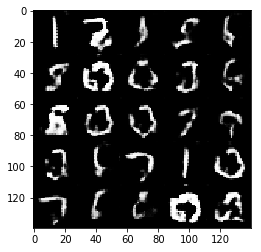

Step 1410... Epoch 3/6... Discriminator Loss: 1.3072... Generator Loss: 3.8674
Step 1420... Epoch 3/6... Discriminator Loss: 0.8253... Generator Loss: 1.0734
Step 1430... Epoch 3/6... Discriminator Loss: 0.4559... Generator Loss: 2.6116
Step 1440... Epoch 3/6... Discriminator Loss: 0.3336... Generator Loss: 2.3899
Step 1450... Epoch 3/6... Discriminator Loss: 0.8317... Generator Loss: 3.1276
Step 1460... Epoch 3/6... Discriminator Loss: 1.0768... Generator Loss: 0.6971
Step 1470... Epoch 3/6... Discriminator Loss: 1.1367... Generator Loss: 0.6441
Step 1480... Epoch 3/6... Discriminator Loss: 1.2557... Generator Loss: 0.5505
Step 1490... Epoch 3/6... Discriminator Loss: 1.3475... Generator Loss: 0.5142
Step 1500... Epoch 3/6... Discriminator Loss: 0.4009... Generator Loss: 1.9641


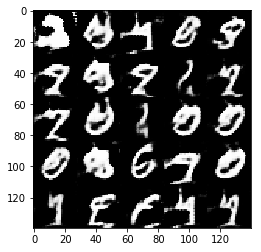

Step 1510... Epoch 3/6... Discriminator Loss: 1.2993... Generator Loss: 5.0508
Step 1520... Epoch 3/6... Discriminator Loss: 0.7408... Generator Loss: 1.1649
Step 1530... Epoch 3/6... Discriminator Loss: 0.9184... Generator Loss: 0.9984
Step 1540... Epoch 3/6... Discriminator Loss: 0.9711... Generator Loss: 0.9259
Step 1550... Epoch 3/6... Discriminator Loss: 0.1548... Generator Loss: 2.7341
Step 1560... Epoch 3/6... Discriminator Loss: 0.7647... Generator Loss: 1.6938
Step 1570... Epoch 3/6... Discriminator Loss: 0.6545... Generator Loss: 4.5486
Step 1580... Epoch 3/6... Discriminator Loss: 1.2495... Generator Loss: 0.6249
Step 1590... Epoch 3/6... Discriminator Loss: 0.8467... Generator Loss: 1.1737
Step 1600... Epoch 3/6... Discriminator Loss: 0.7895... Generator Loss: 1.1736


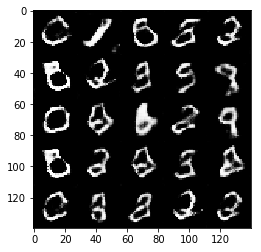

Step 1610... Epoch 3/6... Discriminator Loss: 0.6792... Generator Loss: 2.1490
Step 1620... Epoch 3/6... Discriminator Loss: 1.2558... Generator Loss: 2.8494
Step 1630... Epoch 3/6... Discriminator Loss: 1.1028... Generator Loss: 0.8792
Step 1640... Epoch 3/6... Discriminator Loss: 1.6405... Generator Loss: 0.4031
Step 1650... Epoch 3/6... Discriminator Loss: 1.1737... Generator Loss: 3.2834
Step 1660... Epoch 3/6... Discriminator Loss: 0.5022... Generator Loss: 1.6717
Step 1670... Epoch 3/6... Discriminator Loss: 1.1057... Generator Loss: 0.7996
Step 1680... Epoch 3/6... Discriminator Loss: 0.9095... Generator Loss: 1.1433
Step 1690... Epoch 3/6... Discriminator Loss: 0.3089... Generator Loss: 2.5865
Step 1700... Epoch 3/6... Discriminator Loss: 0.3495... Generator Loss: 2.2393


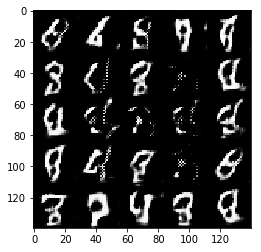

Step 1710... Epoch 3/6... Discriminator Loss: 0.8688... Generator Loss: 1.3121
Step 1720... Epoch 3/6... Discriminator Loss: 0.4465... Generator Loss: 1.7022
Step 1730... Epoch 3/6... Discriminator Loss: 1.7458... Generator Loss: 0.5353
Step 1740... Epoch 3/6... Discriminator Loss: 0.2655... Generator Loss: 2.2530
Step 1750... Epoch 3/6... Discriminator Loss: 0.6101... Generator Loss: 1.6657
Step 1760... Epoch 3/6... Discriminator Loss: 4.0234... Generator Loss: 6.7526
Step 1770... Epoch 3/6... Discriminator Loss: 1.9209... Generator Loss: 3.8537
Step 1780... Epoch 3/6... Discriminator Loss: 1.5822... Generator Loss: 0.6064
Step 1790... Epoch 3/6... Discriminator Loss: 0.7513... Generator Loss: 1.8001
Step 1800... Epoch 3/6... Discriminator Loss: 2.8596... Generator Loss: 0.1635


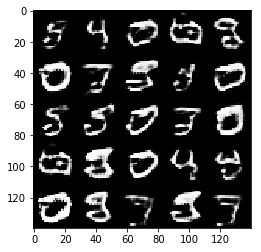

Step 1810... Epoch 4/6... Discriminator Loss: 0.6244... Generator Loss: 2.0826
Step 1820... Epoch 4/6... Discriminator Loss: 3.7723... Generator Loss: 0.2081
Step 1830... Epoch 4/6... Discriminator Loss: 0.6186... Generator Loss: 1.4246
Step 1840... Epoch 4/6... Discriminator Loss: 0.6577... Generator Loss: 2.3755
Step 1850... Epoch 4/6... Discriminator Loss: 0.8018... Generator Loss: 3.2605
Step 1860... Epoch 4/6... Discriminator Loss: 0.6374... Generator Loss: 1.1907
Step 1870... Epoch 4/6... Discriminator Loss: 0.6939... Generator Loss: 3.3033
Step 1880... Epoch 4/6... Discriminator Loss: 0.1153... Generator Loss: 3.5417
Step 1890... Epoch 4/6... Discriminator Loss: 0.3108... Generator Loss: 2.6916
Step 1900... Epoch 4/6... Discriminator Loss: 1.7965... Generator Loss: 8.6740


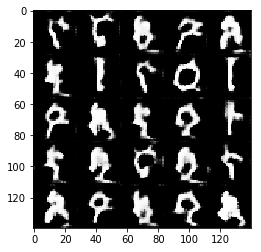

Step 1910... Epoch 4/6... Discriminator Loss: 0.7476... Generator Loss: 1.7334
Step 1920... Epoch 4/6... Discriminator Loss: 0.4479... Generator Loss: 2.4339
Step 1930... Epoch 4/6... Discriminator Loss: 0.4538... Generator Loss: 1.7167
Step 1940... Epoch 4/6... Discriminator Loss: 1.0593... Generator Loss: 3.0803
Step 1950... Epoch 4/6... Discriminator Loss: 0.6219... Generator Loss: 3.5138
Step 1960... Epoch 4/6... Discriminator Loss: 1.5530... Generator Loss: 1.0564
Step 1970... Epoch 4/6... Discriminator Loss: 0.7895... Generator Loss: 1.3607
Step 1980... Epoch 4/6... Discriminator Loss: 1.3386... Generator Loss: 3.1921
Step 1990... Epoch 4/6... Discriminator Loss: 0.7565... Generator Loss: 1.2249
Step 2000... Epoch 4/6... Discriminator Loss: 0.8136... Generator Loss: 1.2480


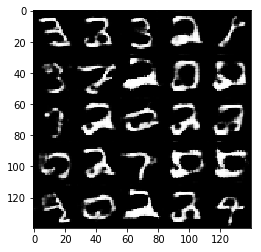

Step 2010... Epoch 4/6... Discriminator Loss: 1.2524... Generator Loss: 3.2774
Step 2020... Epoch 4/6... Discriminator Loss: 0.7824... Generator Loss: 1.1198
Step 2030... Epoch 4/6... Discriminator Loss: 1.2454... Generator Loss: 0.5691
Step 2040... Epoch 4/6... Discriminator Loss: 0.9292... Generator Loss: 0.9391
Step 2050... Epoch 4/6... Discriminator Loss: 1.2947... Generator Loss: 4.4525
Step 2060... Epoch 4/6... Discriminator Loss: 1.1581... Generator Loss: 0.9497
Step 2070... Epoch 4/6... Discriminator Loss: 0.9558... Generator Loss: 0.8016
Step 2080... Epoch 4/6... Discriminator Loss: 0.7077... Generator Loss: 1.0938
Step 2090... Epoch 4/6... Discriminator Loss: 1.6888... Generator Loss: 0.4726
Step 2100... Epoch 4/6... Discriminator Loss: 1.0628... Generator Loss: 1.1549


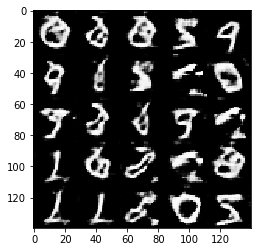

Step 2110... Epoch 4/6... Discriminator Loss: 1.0402... Generator Loss: 2.9120
Step 2120... Epoch 4/6... Discriminator Loss: 0.9542... Generator Loss: 0.9466
Step 2130... Epoch 4/6... Discriminator Loss: 1.7861... Generator Loss: 0.4798
Step 2140... Epoch 4/6... Discriminator Loss: 1.0304... Generator Loss: 0.7632
Step 2150... Epoch 4/6... Discriminator Loss: 1.3625... Generator Loss: 6.0475
Step 2160... Epoch 4/6... Discriminator Loss: 1.2575... Generator Loss: 0.8206
Step 2170... Epoch 4/6... Discriminator Loss: 0.6521... Generator Loss: 1.4699
Step 2180... Epoch 4/6... Discriminator Loss: 0.6872... Generator Loss: 1.9035
Step 2190... Epoch 4/6... Discriminator Loss: 0.6447... Generator Loss: 1.9777
Step 2200... Epoch 4/6... Discriminator Loss: 0.4485... Generator Loss: 1.6754


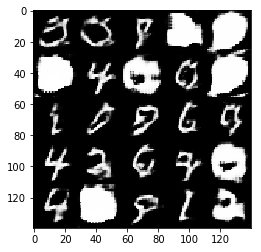

Step 2210... Epoch 4/6... Discriminator Loss: 1.3487... Generator Loss: 1.8833
Step 2220... Epoch 4/6... Discriminator Loss: 1.4535... Generator Loss: 0.5572
Step 2230... Epoch 4/6... Discriminator Loss: 0.7061... Generator Loss: 1.7657
Step 2240... Epoch 4/6... Discriminator Loss: 0.7917... Generator Loss: 1.4454
Step 2250... Epoch 4/6... Discriminator Loss: 2.9229... Generator Loss: 4.9662
Step 2260... Epoch 4/6... Discriminator Loss: 0.7951... Generator Loss: 1.0945
Step 2270... Epoch 4/6... Discriminator Loss: 1.2345... Generator Loss: 2.8785
Step 2280... Epoch 4/6... Discriminator Loss: 1.0767... Generator Loss: 0.8233
Step 2290... Epoch 4/6... Discriminator Loss: 0.5231... Generator Loss: 2.5746
Step 2300... Epoch 4/6... Discriminator Loss: 1.2111... Generator Loss: 0.9281


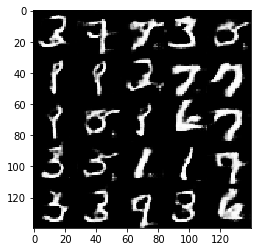

Step 2310... Epoch 4/6... Discriminator Loss: 0.4689... Generator Loss: 3.1353
Step 2320... Epoch 4/6... Discriminator Loss: 1.1545... Generator Loss: 0.8001
Step 2330... Epoch 4/6... Discriminator Loss: 1.0950... Generator Loss: 0.7319
Step 2340... Epoch 4/6... Discriminator Loss: 0.9525... Generator Loss: 1.7929
Step 2350... Epoch 4/6... Discriminator Loss: 0.8014... Generator Loss: 1.2612
Step 2360... Epoch 4/6... Discriminator Loss: 1.0244... Generator Loss: 0.9314
Step 2370... Epoch 4/6... Discriminator Loss: 0.6834... Generator Loss: 2.7432
Step 2380... Epoch 4/6... Discriminator Loss: 1.0065... Generator Loss: 1.6398
Step 2390... Epoch 4/6... Discriminator Loss: 0.8653... Generator Loss: 1.6891
Step 2400... Epoch 4/6... Discriminator Loss: 0.6096... Generator Loss: 2.2708


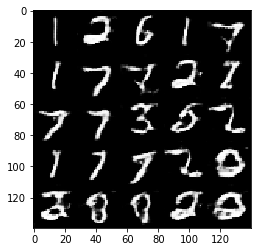

Step 2410... Epoch 5/6... Discriminator Loss: 0.8046... Generator Loss: 1.1897
Step 2420... Epoch 5/6... Discriminator Loss: 1.7020... Generator Loss: 0.4254
Step 2430... Epoch 5/6... Discriminator Loss: 0.6210... Generator Loss: 1.3530
Step 2440... Epoch 5/6... Discriminator Loss: 0.6755... Generator Loss: 1.9047
Step 2450... Epoch 5/6... Discriminator Loss: 0.7291... Generator Loss: 1.9742
Step 2460... Epoch 5/6... Discriminator Loss: 0.8141... Generator Loss: 2.8103
Step 2470... Epoch 5/6... Discriminator Loss: 2.7545... Generator Loss: 5.0264
Step 2480... Epoch 5/6... Discriminator Loss: 1.5575... Generator Loss: 0.6263
Step 2490... Epoch 5/6... Discriminator Loss: 0.8331... Generator Loss: 2.3181
Step 2500... Epoch 5/6... Discriminator Loss: 1.6388... Generator Loss: 0.3647


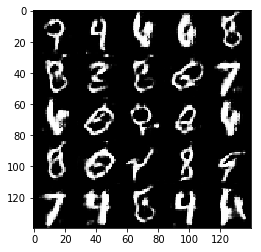

Step 2510... Epoch 5/6... Discriminator Loss: 1.4822... Generator Loss: 0.5644
Step 2520... Epoch 5/6... Discriminator Loss: 1.2605... Generator Loss: 0.6384
Step 2530... Epoch 5/6... Discriminator Loss: 0.7939... Generator Loss: 2.9162
Step 2540... Epoch 5/6... Discriminator Loss: 0.7906... Generator Loss: 2.5317
Step 2550... Epoch 5/6... Discriminator Loss: 0.6608... Generator Loss: 2.5327
Step 2560... Epoch 5/6... Discriminator Loss: 0.8782... Generator Loss: 0.9584
Step 2570... Epoch 5/6... Discriminator Loss: 0.6908... Generator Loss: 1.2214
Step 2580... Epoch 5/6... Discriminator Loss: 2.1715... Generator Loss: 0.2355
Step 2590... Epoch 5/6... Discriminator Loss: 1.0885... Generator Loss: 0.7033
Step 2600... Epoch 5/6... Discriminator Loss: 1.2074... Generator Loss: 0.7621


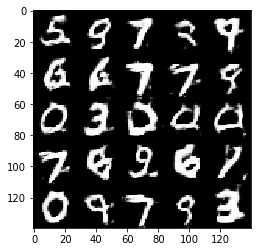

Step 2610... Epoch 5/6... Discriminator Loss: 0.6442... Generator Loss: 1.3259
Step 2620... Epoch 5/6... Discriminator Loss: 1.2015... Generator Loss: 3.8886
Step 2630... Epoch 5/6... Discriminator Loss: 0.8656... Generator Loss: 1.0532
Step 2640... Epoch 5/6... Discriminator Loss: 1.4225... Generator Loss: 0.5546
Step 2650... Epoch 5/6... Discriminator Loss: 0.7787... Generator Loss: 2.3972
Step 2660... Epoch 5/6... Discriminator Loss: 1.1716... Generator Loss: 0.6867
Step 2670... Epoch 5/6... Discriminator Loss: 0.7064... Generator Loss: 1.3143
Step 2680... Epoch 5/6... Discriminator Loss: 1.4296... Generator Loss: 0.6215
Step 2690... Epoch 5/6... Discriminator Loss: 1.0712... Generator Loss: 0.8683
Step 2700... Epoch 5/6... Discriminator Loss: 1.8677... Generator Loss: 0.3895


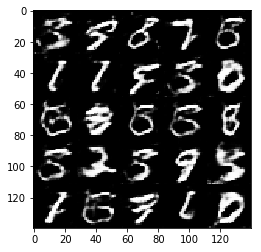

Step 2710... Epoch 5/6... Discriminator Loss: 0.9906... Generator Loss: 3.2417
Step 2720... Epoch 5/6... Discriminator Loss: 0.8249... Generator Loss: 1.0080
Step 2730... Epoch 5/6... Discriminator Loss: 0.8042... Generator Loss: 1.2660
Step 2740... Epoch 5/6... Discriminator Loss: 1.1700... Generator Loss: 0.6437
Step 2750... Epoch 5/6... Discriminator Loss: 0.6238... Generator Loss: 2.1771
Step 2760... Epoch 5/6... Discriminator Loss: 0.9347... Generator Loss: 1.5527
Step 2770... Epoch 5/6... Discriminator Loss: 0.4731... Generator Loss: 2.0227
Step 2780... Epoch 5/6... Discriminator Loss: 0.6358... Generator Loss: 1.9772
Step 2790... Epoch 5/6... Discriminator Loss: 0.7407... Generator Loss: 1.7402
Step 2800... Epoch 5/6... Discriminator Loss: 1.5145... Generator Loss: 0.4299


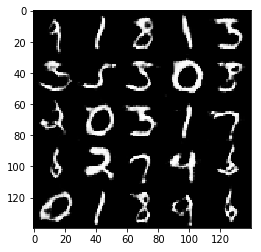

Step 2810... Epoch 5/6... Discriminator Loss: 1.9988... Generator Loss: 0.2962
Step 2820... Epoch 5/6... Discriminator Loss: 1.4423... Generator Loss: 0.5847
Step 2830... Epoch 5/6... Discriminator Loss: 0.9120... Generator Loss: 1.4598
Step 2840... Epoch 5/6... Discriminator Loss: 0.9452... Generator Loss: 0.8666
Step 2850... Epoch 5/6... Discriminator Loss: 1.7472... Generator Loss: 0.3872
Step 2860... Epoch 5/6... Discriminator Loss: 1.1675... Generator Loss: 0.7473
Step 2870... Epoch 5/6... Discriminator Loss: 0.9748... Generator Loss: 0.7313
Step 2880... Epoch 5/6... Discriminator Loss: 2.0519... Generator Loss: 4.1582
Step 2890... Epoch 5/6... Discriminator Loss: 1.0807... Generator Loss: 0.7083
Step 2900... Epoch 5/6... Discriminator Loss: 0.7697... Generator Loss: 1.4087


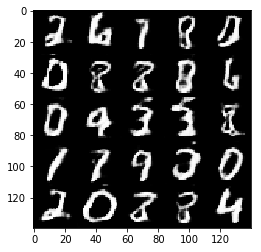

Step 2910... Epoch 5/6... Discriminator Loss: 1.0894... Generator Loss: 3.0906
Step 2920... Epoch 5/6... Discriminator Loss: 1.0066... Generator Loss: 0.8444
Step 2930... Epoch 5/6... Discriminator Loss: 0.7825... Generator Loss: 1.1949
Step 2940... Epoch 5/6... Discriminator Loss: 0.9456... Generator Loss: 2.1332
Step 2950... Epoch 5/6... Discriminator Loss: 1.6273... Generator Loss: 5.2078
Step 2960... Epoch 5/6... Discriminator Loss: 9.8933... Generator Loss: 13.0674
Step 2970... Epoch 5/6... Discriminator Loss: 13.4651... Generator Loss: 12.1893
Step 2980... Epoch 5/6... Discriminator Loss: 0.9859... Generator Loss: 6.4180
Step 2990... Epoch 5/6... Discriminator Loss: 2.6994... Generator Loss: 0.4177
Step 3000... Epoch 5/6... Discriminator Loss: 1.3465... Generator Loss: 1.3920


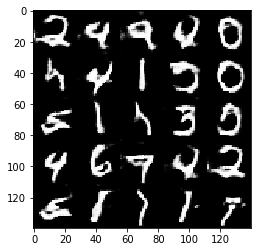

Step 3010... Epoch 6/6... Discriminator Loss: 0.8148... Generator Loss: 1.1750
Step 3020... Epoch 6/6... Discriminator Loss: 1.0852... Generator Loss: 0.8330
Step 3030... Epoch 6/6... Discriminator Loss: 1.1910... Generator Loss: 1.2856
Step 3040... Epoch 6/6... Discriminator Loss: 0.9724... Generator Loss: 1.1203
Step 3050... Epoch 6/6... Discriminator Loss: 0.5932... Generator Loss: 2.0156
Step 3060... Epoch 6/6... Discriminator Loss: 0.4505... Generator Loss: 2.3292
Step 3070... Epoch 6/6... Discriminator Loss: 0.8602... Generator Loss: 1.1734
Step 3080... Epoch 6/6... Discriminator Loss: 1.3039... Generator Loss: 0.8568
Step 3090... Epoch 6/6... Discriminator Loss: 1.1662... Generator Loss: 0.8783
Step 3100... Epoch 6/6... Discriminator Loss: 1.1318... Generator Loss: 2.8387


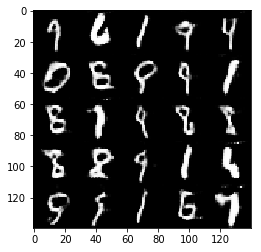

Step 3110... Epoch 6/6... Discriminator Loss: 0.8120... Generator Loss: 1.8343
Step 3120... Epoch 6/6... Discriminator Loss: 0.9871... Generator Loss: 1.6976
Step 3130... Epoch 6/6... Discriminator Loss: 0.6933... Generator Loss: 1.2136
Step 3140... Epoch 6/6... Discriminator Loss: 1.0142... Generator Loss: 1.3155
Step 3150... Epoch 6/6... Discriminator Loss: 1.6138... Generator Loss: 0.4934
Step 3160... Epoch 6/6... Discriminator Loss: 1.4799... Generator Loss: 0.5477
Step 3170... Epoch 6/6... Discriminator Loss: 0.8513... Generator Loss: 1.5418
Step 3180... Epoch 6/6... Discriminator Loss: 1.0734... Generator Loss: 1.1447
Step 3190... Epoch 6/6... Discriminator Loss: 1.4949... Generator Loss: 0.6082
Step 3200... Epoch 6/6... Discriminator Loss: 0.9193... Generator Loss: 2.2137


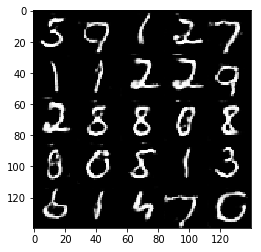

Step 3210... Epoch 6/6... Discriminator Loss: 0.8732... Generator Loss: 1.1063
Step 3220... Epoch 6/6... Discriminator Loss: 0.8627... Generator Loss: 1.2943
Step 3230... Epoch 6/6... Discriminator Loss: 2.1055... Generator Loss: 0.2868
Step 3240... Epoch 6/6... Discriminator Loss: 1.0039... Generator Loss: 3.3099
Step 3250... Epoch 6/6... Discriminator Loss: 0.7679... Generator Loss: 0.9873
Step 3260... Epoch 6/6... Discriminator Loss: 2.6454... Generator Loss: 0.2976
Step 3270... Epoch 6/6... Discriminator Loss: 2.0509... Generator Loss: 0.2421
Step 3280... Epoch 6/6... Discriminator Loss: 1.0505... Generator Loss: 0.7408
Step 3290... Epoch 6/6... Discriminator Loss: 0.6753... Generator Loss: 1.8978
Step 3300... Epoch 6/6... Discriminator Loss: 1.0318... Generator Loss: 0.9898


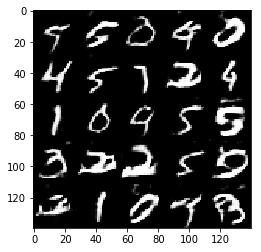

Step 3310... Epoch 6/6... Discriminator Loss: 0.9931... Generator Loss: 2.6111
Step 3320... Epoch 6/6... Discriminator Loss: 1.3667... Generator Loss: 0.4967
Step 3330... Epoch 6/6... Discriminator Loss: 0.9606... Generator Loss: 2.0185
Step 3340... Epoch 6/6... Discriminator Loss: 0.7958... Generator Loss: 1.5250
Step 3350... Epoch 6/6... Discriminator Loss: 0.7981... Generator Loss: 1.1867
Step 3360... Epoch 6/6... Discriminator Loss: 0.9848... Generator Loss: 0.8419
Step 3370... Epoch 6/6... Discriminator Loss: 1.6590... Generator Loss: 0.4355
Step 3380... Epoch 6/6... Discriminator Loss: 0.8542... Generator Loss: 2.2755
Step 3390... Epoch 6/6... Discriminator Loss: 0.8245... Generator Loss: 1.1749
Step 3400... Epoch 6/6... Discriminator Loss: 1.2024... Generator Loss: 0.7346


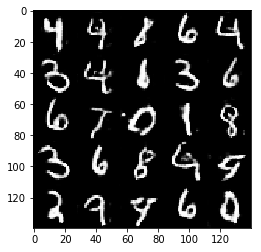

Step 3410... Epoch 6/6... Discriminator Loss: 0.7856... Generator Loss: 1.4127
Step 3420... Epoch 6/6... Discriminator Loss: 1.5676... Generator Loss: 0.4423
Step 3430... Epoch 6/6... Discriminator Loss: 1.0441... Generator Loss: 1.5245
Step 3440... Epoch 6/6... Discriminator Loss: 0.9213... Generator Loss: 1.6693
Step 3450... Epoch 6/6... Discriminator Loss: 1.8639... Generator Loss: 0.2795
Step 3460... Epoch 6/6... Discriminator Loss: 1.7960... Generator Loss: 0.3720
Step 3470... Epoch 6/6... Discriminator Loss: 1.3580... Generator Loss: 0.8174
Step 3480... Epoch 6/6... Discriminator Loss: 2.6623... Generator Loss: 4.3634
Step 3490... Epoch 6/6... Discriminator Loss: 0.8892... Generator Loss: 2.7640
Step 3500... Epoch 6/6... Discriminator Loss: 1.1781... Generator Loss: 1.0172


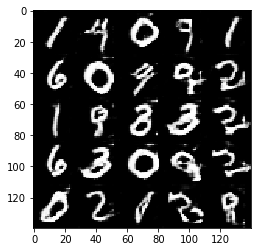

Step 3510... Epoch 6/6... Discriminator Loss: 1.5925... Generator Loss: 3.3376
Step 3520... Epoch 6/6... Discriminator Loss: 1.0110... Generator Loss: 1.6107
Step 3530... Epoch 6/6... Discriminator Loss: 1.6737... Generator Loss: 0.4934
Step 3540... Epoch 6/6... Discriminator Loss: 2.2947... Generator Loss: 3.2946
Step 3550... Epoch 6/6... Discriminator Loss: 2.2459... Generator Loss: 6.1517
Step 3560... Epoch 6/6... Discriminator Loss: 8.3225... Generator Loss: 11.9117
Step 3570... Epoch 6/6... Discriminator Loss: 3.8265... Generator Loss: 6.9292
Step 3580... Epoch 6/6... Discriminator Loss: 4.4931... Generator Loss: 7.0854
Step 3590... Epoch 6/6... Discriminator Loss: 3.1454... Generator Loss: 4.5451
Step 3600... Epoch 6/6... Discriminator Loss: 0.8723... Generator Loss: 1.1101


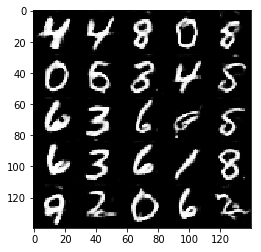

In [126]:
batch_size = 100
z_dim = 256
learning_rate = 0.03
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 6

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

In [60]:
print(data_dir)
celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
a = celeba_dataset.get_batches(10)
for each in a:
    print(each)

/data


In [61]:
os.path.join(data_dir, 'img_align_celeba/')

'/data\\img_align_celeba/'

Step 10... Epoch 1/10... Discriminator Loss: 5.6662... Generator Loss: 0.0590
Step 20... Epoch 1/10... Discriminator Loss: 7.9440... Generator Loss: 43.8157
Step 30... Epoch 1/10... Discriminator Loss: 1.1276... Generator Loss: 0.7146
Step 40... Epoch 1/10... Discriminator Loss: 0.5021... Generator Loss: 10.7636
Step 50... Epoch 1/10... Discriminator Loss: 0.2604... Generator Loss: 13.0863
Step 60... Epoch 1/10... Discriminator Loss: 8.1675... Generator Loss: 0.0802
Step 70... Epoch 1/10... Discriminator Loss: 0.2156... Generator Loss: 5.9862
Step 80... Epoch 1/10... Discriminator Loss: 0.2296... Generator Loss: 4.6853
Step 90... Epoch 1/10... Discriminator Loss: 0.1875... Generator Loss: 5.0671
Step 100... Epoch 1/10... Discriminator Loss: 0.1438... Generator Loss: 16.7294


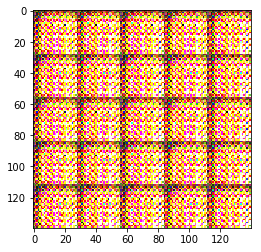

Step 110... Epoch 1/10... Discriminator Loss: 15.1576... Generator Loss: 44.2427
Step 120... Epoch 1/10... Discriminator Loss: 0.2208... Generator Loss: 4.4152
Step 130... Epoch 1/10... Discriminator Loss: 0.1554... Generator Loss: 3.1713
Step 140... Epoch 1/10... Discriminator Loss: 0.2893... Generator Loss: 23.0230
Step 150... Epoch 1/10... Discriminator Loss: 1.2953... Generator Loss: 0.3823
Step 160... Epoch 1/10... Discriminator Loss: 0.1146... Generator Loss: 14.2508
Step 170... Epoch 1/10... Discriminator Loss: 0.1041... Generator Loss: 7.5382
Step 180... Epoch 1/10... Discriminator Loss: 0.2861... Generator Loss: 11.9816
Step 190... Epoch 1/10... Discriminator Loss: 0.6174... Generator Loss: 6.6689
Step 200... Epoch 1/10... Discriminator Loss: 3.2199... Generator Loss: 0.1257


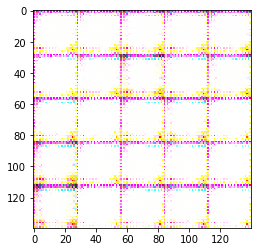

Step 210... Epoch 1/10... Discriminator Loss: 1.0388... Generator Loss: 0.9267
Step 220... Epoch 1/10... Discriminator Loss: 0.4869... Generator Loss: 4.6988
Step 230... Epoch 1/10... Discriminator Loss: 2.5232... Generator Loss: 0.3049
Step 240... Epoch 1/10... Discriminator Loss: 0.3379... Generator Loss: 2.2560
Step 250... Epoch 1/10... Discriminator Loss: 0.3185... Generator Loss: 2.8645
Step 260... Epoch 1/10... Discriminator Loss: 0.5705... Generator Loss: 1.3710
Step 270... Epoch 1/10... Discriminator Loss: 2.6147... Generator Loss: 0.1189
Step 280... Epoch 1/10... Discriminator Loss: 0.2491... Generator Loss: 2.0285
Step 290... Epoch 1/10... Discriminator Loss: 0.2360... Generator Loss: 2.6235
Step 300... Epoch 1/10... Discriminator Loss: 0.3381... Generator Loss: 3.7197


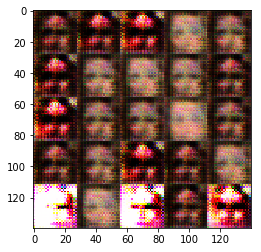

Step 310... Epoch 1/10... Discriminator Loss: 0.8054... Generator Loss: 1.3281
Step 320... Epoch 1/10... Discriminator Loss: 0.1993... Generator Loss: 2.7458
Step 330... Epoch 1/10... Discriminator Loss: 2.9213... Generator Loss: 0.0977
Step 340... Epoch 1/10... Discriminator Loss: 0.3557... Generator Loss: 4.0040
Step 350... Epoch 1/10... Discriminator Loss: 0.1520... Generator Loss: 3.5785
Step 360... Epoch 1/10... Discriminator Loss: 1.1649... Generator Loss: 0.9937
Step 370... Epoch 1/10... Discriminator Loss: 0.2177... Generator Loss: 2.6157
Step 380... Epoch 1/10... Discriminator Loss: 1.7271... Generator Loss: 0.3216
Step 390... Epoch 1/10... Discriminator Loss: 0.9724... Generator Loss: 6.4649
Step 400... Epoch 1/10... Discriminator Loss: 0.0750... Generator Loss: 5.5447


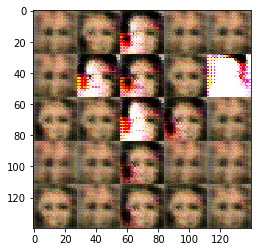

Step 410... Epoch 1/10... Discriminator Loss: 0.1060... Generator Loss: 4.8176
Step 420... Epoch 1/10... Discriminator Loss: 7.2819... Generator Loss: 8.7486
Step 430... Epoch 1/10... Discriminator Loss: 0.1082... Generator Loss: 3.8606
Step 440... Epoch 1/10... Discriminator Loss: 0.1656... Generator Loss: 3.1515
Step 450... Epoch 1/10... Discriminator Loss: 0.4243... Generator Loss: 3.9259
Step 460... Epoch 1/10... Discriminator Loss: 1.4325... Generator Loss: 0.6590
Step 470... Epoch 1/10... Discriminator Loss: 0.2579... Generator Loss: 2.3651
Step 480... Epoch 1/10... Discriminator Loss: 0.3250... Generator Loss: 1.7477
Step 490... Epoch 1/10... Discriminator Loss: 0.4497... Generator Loss: 4.3363
Step 500... Epoch 1/10... Discriminator Loss: 0.8901... Generator Loss: 0.9755


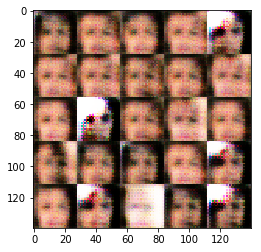

Step 510... Epoch 1/10... Discriminator Loss: 0.1513... Generator Loss: 2.7435
Step 520... Epoch 1/10... Discriminator Loss: 5.8641... Generator Loss: 9.3989
Step 530... Epoch 1/10... Discriminator Loss: 0.1283... Generator Loss: 3.6544
Step 540... Epoch 1/10... Discriminator Loss: 0.5802... Generator Loss: 2.2679
Step 550... Epoch 1/10... Discriminator Loss: 1.0525... Generator Loss: 4.4151
Step 560... Epoch 1/10... Discriminator Loss: 0.5481... Generator Loss: 2.3424
Step 570... Epoch 1/10... Discriminator Loss: 1.0426... Generator Loss: 0.5846
Step 580... Epoch 1/10... Discriminator Loss: 0.5591... Generator Loss: 1.1225
Step 590... Epoch 1/10... Discriminator Loss: 0.2617... Generator Loss: 2.1048
Step 600... Epoch 1/10... Discriminator Loss: 1.1813... Generator Loss: 6.3969


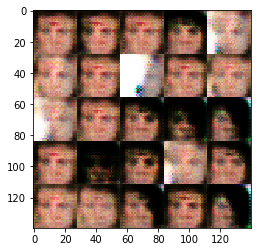

Step 610... Epoch 1/10... Discriminator Loss: 1.2003... Generator Loss: 0.7005
Step 620... Epoch 1/10... Discriminator Loss: 1.3852... Generator Loss: 0.4268
Step 630... Epoch 1/10... Discriminator Loss: 1.6234... Generator Loss: 1.3857
Step 640... Epoch 1/10... Discriminator Loss: 0.8612... Generator Loss: 1.3060
Step 650... Epoch 1/10... Discriminator Loss: 0.3480... Generator Loss: 3.3801
Step 660... Epoch 1/10... Discriminator Loss: 2.7569... Generator Loss: 0.5742
Step 670... Epoch 1/10... Discriminator Loss: 0.2657... Generator Loss: 2.2080
Step 680... Epoch 1/10... Discriminator Loss: 2.5362... Generator Loss: 0.6490
Step 690... Epoch 1/10... Discriminator Loss: 2.8219... Generator Loss: 1.2138
Step 700... Epoch 1/10... Discriminator Loss: 1.5223... Generator Loss: 4.0906


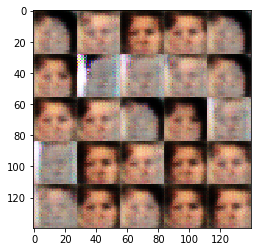

Step 710... Epoch 1/10... Discriminator Loss: 0.5363... Generator Loss: 1.2889
Step 720... Epoch 1/10... Discriminator Loss: 7.1665... Generator Loss: 6.8397
Step 730... Epoch 1/10... Discriminator Loss: 0.2044... Generator Loss: 2.8321
Step 740... Epoch 1/10... Discriminator Loss: 0.8463... Generator Loss: 4.2309
Step 750... Epoch 1/10... Discriminator Loss: 0.2145... Generator Loss: 2.9782
Step 760... Epoch 1/10... Discriminator Loss: 0.9552... Generator Loss: 1.6347
Step 770... Epoch 1/10... Discriminator Loss: 1.2220... Generator Loss: 1.4075
Step 780... Epoch 1/10... Discriminator Loss: 1.9914... Generator Loss: 4.8419
Step 790... Epoch 1/10... Discriminator Loss: 0.2066... Generator Loss: 2.5522
Step 800... Epoch 1/10... Discriminator Loss: 1.5759... Generator Loss: 0.5655


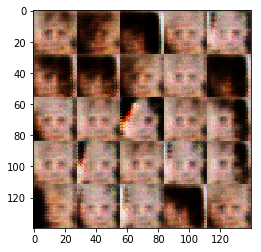

Step 810... Epoch 1/10... Discriminator Loss: 0.8182... Generator Loss: 0.8945
Step 820... Epoch 1/10... Discriminator Loss: 3.0454... Generator Loss: 0.1132
Step 830... Epoch 1/10... Discriminator Loss: 6.1009... Generator Loss: 6.1896
Step 840... Epoch 1/10... Discriminator Loss: 1.2967... Generator Loss: 1.4373
Step 850... Epoch 1/10... Discriminator Loss: 1.0217... Generator Loss: 2.2604
Step 860... Epoch 1/10... Discriminator Loss: 1.3438... Generator Loss: 0.5663
Step 870... Epoch 1/10... Discriminator Loss: 0.8822... Generator Loss: 1.4876
Step 880... Epoch 1/10... Discriminator Loss: 0.5470... Generator Loss: 1.8599
Step 890... Epoch 1/10... Discriminator Loss: 1.1268... Generator Loss: 0.5659
Step 900... Epoch 1/10... Discriminator Loss: 0.3789... Generator Loss: 1.7275


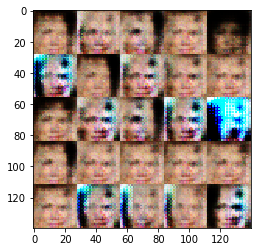

Step 910... Epoch 1/10... Discriminator Loss: 0.4329... Generator Loss: 3.8696
Step 920... Epoch 1/10... Discriminator Loss: 0.5668... Generator Loss: 1.6008
Step 930... Epoch 1/10... Discriminator Loss: 1.6650... Generator Loss: 0.4258
Step 940... Epoch 1/10... Discriminator Loss: 0.6964... Generator Loss: 2.0701
Step 950... Epoch 1/10... Discriminator Loss: 0.4662... Generator Loss: 1.5229
Step 960... Epoch 1/10... Discriminator Loss: 1.1066... Generator Loss: 0.9026
Step 970... Epoch 1/10... Discriminator Loss: 2.6199... Generator Loss: 7.0186
Step 980... Epoch 1/10... Discriminator Loss: 1.0855... Generator Loss: 0.6282
Step 990... Epoch 1/10... Discriminator Loss: 0.8322... Generator Loss: 0.9445
Step 1000... Epoch 1/10... Discriminator Loss: 0.4835... Generator Loss: 1.7230


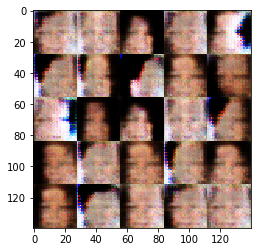

Step 1010... Epoch 1/10... Discriminator Loss: 0.5743... Generator Loss: 3.1896
Step 1020... Epoch 2/10... Discriminator Loss: 0.5184... Generator Loss: 3.3301
Step 1030... Epoch 2/10... Discriminator Loss: 0.3594... Generator Loss: 1.5569
Step 1040... Epoch 2/10... Discriminator Loss: 0.4145... Generator Loss: 2.2482
Step 1050... Epoch 2/10... Discriminator Loss: 0.5204... Generator Loss: 1.5652
Step 1060... Epoch 2/10... Discriminator Loss: 0.6843... Generator Loss: 1.2683
Step 1070... Epoch 2/10... Discriminator Loss: 0.5797... Generator Loss: 1.4357
Step 1080... Epoch 2/10... Discriminator Loss: 0.7290... Generator Loss: 4.0648
Step 1090... Epoch 2/10... Discriminator Loss: 1.6395... Generator Loss: 4.1709
Step 1100... Epoch 2/10... Discriminator Loss: 0.5961... Generator Loss: 1.5171


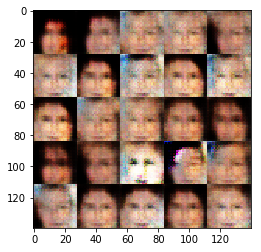

Step 1110... Epoch 2/10... Discriminator Loss: 2.4720... Generator Loss: 5.9176
Step 1120... Epoch 2/10... Discriminator Loss: 0.4318... Generator Loss: 2.2728
Step 1130... Epoch 2/10... Discriminator Loss: 0.3239... Generator Loss: 2.6295
Step 1140... Epoch 2/10... Discriminator Loss: 0.2980... Generator Loss: 1.9270
Step 1150... Epoch 2/10... Discriminator Loss: 0.9422... Generator Loss: 1.3032
Step 1160... Epoch 2/10... Discriminator Loss: 2.6835... Generator Loss: 5.1402
Step 1170... Epoch 2/10... Discriminator Loss: 0.5409... Generator Loss: 1.2722
Step 1180... Epoch 2/10... Discriminator Loss: 0.2665... Generator Loss: 1.9297
Step 1190... Epoch 2/10... Discriminator Loss: 1.5453... Generator Loss: 0.4805
Step 1200... Epoch 2/10... Discriminator Loss: 1.7137... Generator Loss: 4.0874


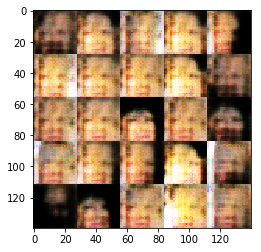

Step 1210... Epoch 2/10... Discriminator Loss: 1.0694... Generator Loss: 0.9719
Step 1220... Epoch 2/10... Discriminator Loss: 2.9829... Generator Loss: 0.1537
Step 1230... Epoch 2/10... Discriminator Loss: 1.4906... Generator Loss: 0.4116
Step 1240... Epoch 2/10... Discriminator Loss: 1.4921... Generator Loss: 0.4146
Step 1250... Epoch 2/10... Discriminator Loss: 1.0800... Generator Loss: 3.0592
Step 1260... Epoch 2/10... Discriminator Loss: 0.9124... Generator Loss: 1.5400
Step 1270... Epoch 2/10... Discriminator Loss: 3.1070... Generator Loss: 0.1383
Step 1280... Epoch 2/10... Discriminator Loss: 0.5816... Generator Loss: 1.3339
Step 1290... Epoch 2/10... Discriminator Loss: 0.6068... Generator Loss: 1.7426
Step 1300... Epoch 2/10... Discriminator Loss: 0.8566... Generator Loss: 2.4694


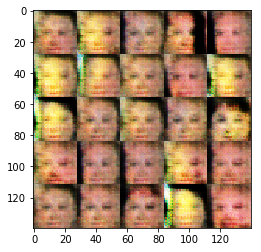

Step 1310... Epoch 2/10... Discriminator Loss: 0.4864... Generator Loss: 1.4485
Step 1320... Epoch 2/10... Discriminator Loss: 1.8835... Generator Loss: 5.1692
Step 1330... Epoch 2/10... Discriminator Loss: 1.6334... Generator Loss: 4.0646
Step 1340... Epoch 2/10... Discriminator Loss: 0.9895... Generator Loss: 1.8692
Step 1350... Epoch 2/10... Discriminator Loss: 1.7147... Generator Loss: 0.2990
Step 1360... Epoch 2/10... Discriminator Loss: 1.0883... Generator Loss: 1.0074
Step 1370... Epoch 2/10... Discriminator Loss: 1.0078... Generator Loss: 0.7432
Step 1380... Epoch 2/10... Discriminator Loss: 0.6344... Generator Loss: 2.1800
Step 1390... Epoch 2/10... Discriminator Loss: 0.6144... Generator Loss: 1.6023
Step 1400... Epoch 2/10... Discriminator Loss: 0.5081... Generator Loss: 2.2814


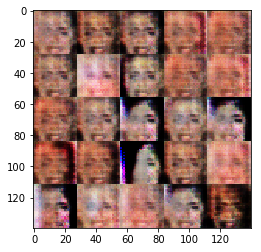

Step 1410... Epoch 2/10... Discriminator Loss: 1.6086... Generator Loss: 0.3238
Step 1420... Epoch 2/10... Discriminator Loss: 1.0743... Generator Loss: 1.0418
Step 1430... Epoch 2/10... Discriminator Loss: 2.3226... Generator Loss: 3.9895
Step 1440... Epoch 2/10... Discriminator Loss: 0.7434... Generator Loss: 2.5432
Step 1450... Epoch 2/10... Discriminator Loss: 1.0249... Generator Loss: 0.6707
Step 1460... Epoch 2/10... Discriminator Loss: 1.5755... Generator Loss: 0.9359
Step 1470... Epoch 2/10... Discriminator Loss: 0.8987... Generator Loss: 0.7646
Step 1480... Epoch 2/10... Discriminator Loss: 0.5957... Generator Loss: 1.2858
Step 1490... Epoch 2/10... Discriminator Loss: 1.3827... Generator Loss: 0.6639
Step 1500... Epoch 2/10... Discriminator Loss: 0.7612... Generator Loss: 1.0013


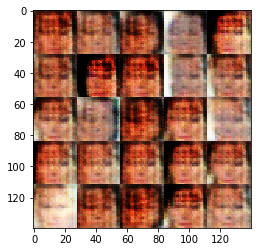

Step 1510... Epoch 2/10... Discriminator Loss: 1.2884... Generator Loss: 0.5210
Step 1520... Epoch 2/10... Discriminator Loss: 0.7425... Generator Loss: 0.8736
Step 1530... Epoch 2/10... Discriminator Loss: 1.6356... Generator Loss: 0.3781
Step 1540... Epoch 2/10... Discriminator Loss: 1.4330... Generator Loss: 0.6165
Step 1550... Epoch 2/10... Discriminator Loss: 1.5897... Generator Loss: 1.5577
Step 1560... Epoch 2/10... Discriminator Loss: 0.6718... Generator Loss: 2.2124
Step 1570... Epoch 2/10... Discriminator Loss: 0.7903... Generator Loss: 2.0548
Step 1580... Epoch 2/10... Discriminator Loss: 0.8556... Generator Loss: 1.3510
Step 1590... Epoch 2/10... Discriminator Loss: 0.9775... Generator Loss: 1.3795
Step 1600... Epoch 2/10... Discriminator Loss: 0.5165... Generator Loss: 2.5582


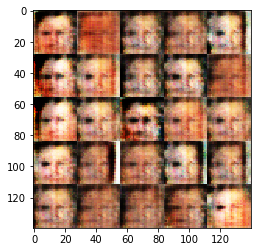

Step 1610... Epoch 2/10... Discriminator Loss: 0.4439... Generator Loss: 1.7127
Step 1620... Epoch 2/10... Discriminator Loss: 1.0959... Generator Loss: 0.5730
Step 1630... Epoch 2/10... Discriminator Loss: 1.7295... Generator Loss: 4.2848
Step 1640... Epoch 2/10... Discriminator Loss: 0.9474... Generator Loss: 0.6689
Step 1650... Epoch 2/10... Discriminator Loss: 0.6698... Generator Loss: 1.1087
Step 1660... Epoch 2/10... Discriminator Loss: 2.1231... Generator Loss: 4.8358
Step 1670... Epoch 2/10... Discriminator Loss: 2.0059... Generator Loss: 0.3213
Step 1680... Epoch 2/10... Discriminator Loss: 1.0209... Generator Loss: 3.4626
Step 1690... Epoch 2/10... Discriminator Loss: 2.4920... Generator Loss: 3.4934
Step 1700... Epoch 2/10... Discriminator Loss: 1.0064... Generator Loss: 1.1897


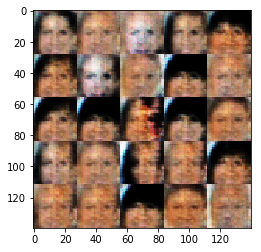

Step 1710... Epoch 2/10... Discriminator Loss: 1.2323... Generator Loss: 1.2390
Step 1720... Epoch 2/10... Discriminator Loss: 0.6144... Generator Loss: 1.2433
Step 1730... Epoch 2/10... Discriminator Loss: 0.4428... Generator Loss: 1.6533
Step 1740... Epoch 2/10... Discriminator Loss: 0.2511... Generator Loss: 1.9154
Step 1750... Epoch 2/10... Discriminator Loss: 0.5634... Generator Loss: 1.6044
Step 1760... Epoch 2/10... Discriminator Loss: 0.8941... Generator Loss: 3.1222
Step 1770... Epoch 2/10... Discriminator Loss: 0.9548... Generator Loss: 2.5277
Step 1780... Epoch 2/10... Discriminator Loss: 0.6326... Generator Loss: 1.3635
Step 1790... Epoch 2/10... Discriminator Loss: 0.7944... Generator Loss: 0.8368
Step 1800... Epoch 2/10... Discriminator Loss: 0.2636... Generator Loss: 2.1809


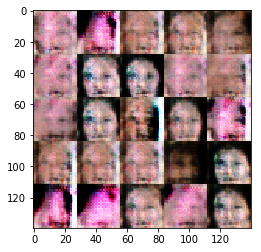

Step 1810... Epoch 2/10... Discriminator Loss: 0.5685... Generator Loss: 1.4174
Step 1820... Epoch 2/10... Discriminator Loss: 0.4863... Generator Loss: 1.3030
Step 1830... Epoch 2/10... Discriminator Loss: 0.5204... Generator Loss: 2.4791
Step 1840... Epoch 2/10... Discriminator Loss: 0.9302... Generator Loss: 2.5076
Step 1850... Epoch 2/10... Discriminator Loss: 0.4669... Generator Loss: 1.4903
Step 1860... Epoch 2/10... Discriminator Loss: 0.2206... Generator Loss: 3.9411
Step 1870... Epoch 2/10... Discriminator Loss: 0.6063... Generator Loss: 1.3265
Step 1880... Epoch 2/10... Discriminator Loss: 2.0845... Generator Loss: 0.9565
Step 1890... Epoch 2/10... Discriminator Loss: 0.8686... Generator Loss: 1.1686
Step 1900... Epoch 2/10... Discriminator Loss: 0.3202... Generator Loss: 2.1653


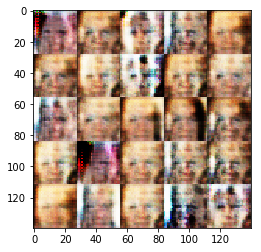

Step 1910... Epoch 2/10... Discriminator Loss: 0.9347... Generator Loss: 0.6851
Step 1920... Epoch 2/10... Discriminator Loss: 0.7856... Generator Loss: 1.3491
Step 1930... Epoch 2/10... Discriminator Loss: 0.6981... Generator Loss: 2.5005
Step 1940... Epoch 2/10... Discriminator Loss: 1.8913... Generator Loss: 1.6287
Step 1950... Epoch 2/10... Discriminator Loss: 1.0395... Generator Loss: 1.1707
Step 1960... Epoch 2/10... Discriminator Loss: 1.0757... Generator Loss: 1.1051
Step 1970... Epoch 2/10... Discriminator Loss: 0.7088... Generator Loss: 1.9370
Step 1980... Epoch 2/10... Discriminator Loss: 1.8408... Generator Loss: 0.4585
Step 1990... Epoch 2/10... Discriminator Loss: 1.3995... Generator Loss: 3.5625
Step 2000... Epoch 2/10... Discriminator Loss: 1.0396... Generator Loss: 1.6305


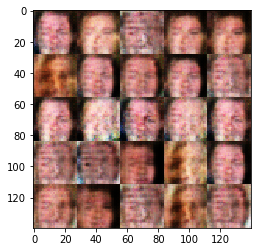

Step 2010... Epoch 2/10... Discriminator Loss: 1.5887... Generator Loss: 1.3174
Step 2020... Epoch 2/10... Discriminator Loss: 0.6455... Generator Loss: 1.5597
Step 2030... Epoch 3/10... Discriminator Loss: 2.1722... Generator Loss: 3.7366
Step 2040... Epoch 3/10... Discriminator Loss: 0.8244... Generator Loss: 1.1984
Step 2050... Epoch 3/10... Discriminator Loss: 0.6245... Generator Loss: 1.6196
Step 2060... Epoch 3/10... Discriminator Loss: 0.8448... Generator Loss: 3.8174
Step 2070... Epoch 3/10... Discriminator Loss: 1.2229... Generator Loss: 3.5733
Step 2080... Epoch 3/10... Discriminator Loss: 0.9071... Generator Loss: 0.8515
Step 2090... Epoch 3/10... Discriminator Loss: 1.4860... Generator Loss: 0.6359
Step 2100... Epoch 3/10... Discriminator Loss: 0.9105... Generator Loss: 1.1259


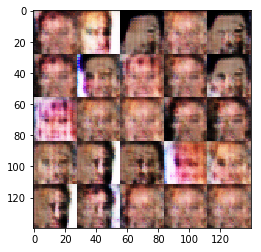

Step 2110... Epoch 3/10... Discriminator Loss: 1.0578... Generator Loss: 2.2242
Step 2120... Epoch 3/10... Discriminator Loss: 1.1825... Generator Loss: 2.5788
Step 2130... Epoch 3/10... Discriminator Loss: 1.9231... Generator Loss: 3.7997
Step 2140... Epoch 3/10... Discriminator Loss: 1.0605... Generator Loss: 0.8820
Step 2150... Epoch 3/10... Discriminator Loss: 0.9946... Generator Loss: 1.9180
Step 2160... Epoch 3/10... Discriminator Loss: 0.8376... Generator Loss: 0.9500
Step 2170... Epoch 3/10... Discriminator Loss: 1.5493... Generator Loss: 0.9096
Step 2180... Epoch 3/10... Discriminator Loss: 1.4637... Generator Loss: 0.4957
Step 2190... Epoch 3/10... Discriminator Loss: 0.7953... Generator Loss: 0.9457
Step 2200... Epoch 3/10... Discriminator Loss: 0.8560... Generator Loss: 2.0621


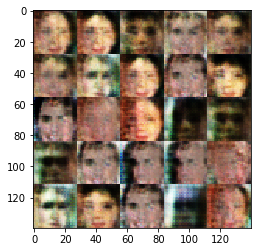

Step 2210... Epoch 3/10... Discriminator Loss: 1.3523... Generator Loss: 0.4643
Step 2220... Epoch 3/10... Discriminator Loss: 1.4420... Generator Loss: 0.6106
Step 2230... Epoch 3/10... Discriminator Loss: 1.0657... Generator Loss: 0.9293
Step 2240... Epoch 3/10... Discriminator Loss: 1.1247... Generator Loss: 0.5800
Step 2250... Epoch 3/10... Discriminator Loss: 1.3262... Generator Loss: 0.6457
Step 2260... Epoch 3/10... Discriminator Loss: 0.9127... Generator Loss: 1.3051
Step 2270... Epoch 3/10... Discriminator Loss: 0.8603... Generator Loss: 2.0468
Step 2280... Epoch 3/10... Discriminator Loss: 2.3232... Generator Loss: 3.7955
Step 2290... Epoch 3/10... Discriminator Loss: 0.8561... Generator Loss: 0.8285
Step 2300... Epoch 3/10... Discriminator Loss: 0.6103... Generator Loss: 1.5591


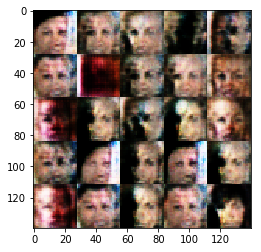

Step 2310... Epoch 3/10... Discriminator Loss: 2.2016... Generator Loss: 0.2146
Step 2320... Epoch 3/10... Discriminator Loss: 0.9811... Generator Loss: 0.7177
Step 2330... Epoch 3/10... Discriminator Loss: 1.6067... Generator Loss: 0.3799
Step 2340... Epoch 3/10... Discriminator Loss: 1.0155... Generator Loss: 1.1568
Step 2350... Epoch 3/10... Discriminator Loss: 1.4948... Generator Loss: 0.3634
Step 2360... Epoch 3/10... Discriminator Loss: 0.7125... Generator Loss: 2.1624
Step 2370... Epoch 3/10... Discriminator Loss: 1.2393... Generator Loss: 1.1704
Step 2380... Epoch 3/10... Discriminator Loss: 0.8679... Generator Loss: 0.7817
Step 2390... Epoch 3/10... Discriminator Loss: 0.8533... Generator Loss: 1.6418
Step 2400... Epoch 3/10... Discriminator Loss: 0.4930... Generator Loss: 1.1589


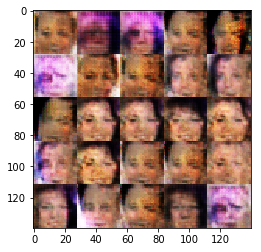

Step 2410... Epoch 3/10... Discriminator Loss: 1.1514... Generator Loss: 2.0385
Step 2420... Epoch 3/10... Discriminator Loss: 0.9550... Generator Loss: 1.4622
Step 2430... Epoch 3/10... Discriminator Loss: 0.9671... Generator Loss: 0.7226
Step 2440... Epoch 3/10... Discriminator Loss: 3.1965... Generator Loss: 4.3916
Step 2450... Epoch 3/10... Discriminator Loss: 0.9685... Generator Loss: 2.0717
Step 2460... Epoch 3/10... Discriminator Loss: 0.8177... Generator Loss: 0.8149
Step 2470... Epoch 3/10... Discriminator Loss: 1.2796... Generator Loss: 0.4395
Step 2480... Epoch 3/10... Discriminator Loss: 0.7168... Generator Loss: 0.9020
Step 2490... Epoch 3/10... Discriminator Loss: 1.1213... Generator Loss: 2.3374
Step 2500... Epoch 3/10... Discriminator Loss: 0.6876... Generator Loss: 1.0414


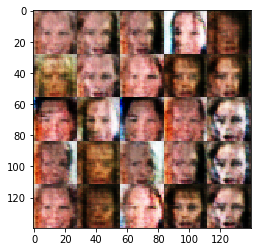

Step 2510... Epoch 3/10... Discriminator Loss: 0.6522... Generator Loss: 1.0037
Step 2520... Epoch 3/10... Discriminator Loss: 1.2517... Generator Loss: 0.6928
Step 2530... Epoch 3/10... Discriminator Loss: 0.7577... Generator Loss: 0.9585
Step 2540... Epoch 3/10... Discriminator Loss: 0.8390... Generator Loss: 0.9666
Step 2550... Epoch 3/10... Discriminator Loss: 1.2537... Generator Loss: 2.7334
Step 2560... Epoch 3/10... Discriminator Loss: 1.2259... Generator Loss: 0.5466
Step 2570... Epoch 3/10... Discriminator Loss: 0.9408... Generator Loss: 1.4422
Step 2580... Epoch 3/10... Discriminator Loss: 0.9678... Generator Loss: 0.7814
Step 2590... Epoch 3/10... Discriminator Loss: 0.6612... Generator Loss: 1.7556
Step 2600... Epoch 3/10... Discriminator Loss: 1.6634... Generator Loss: 0.5032


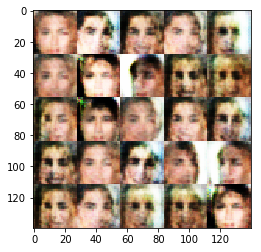

Step 2610... Epoch 3/10... Discriminator Loss: 0.5823... Generator Loss: 2.1824
Step 2620... Epoch 3/10... Discriminator Loss: 1.2068... Generator Loss: 2.5432
Step 2630... Epoch 3/10... Discriminator Loss: 1.0810... Generator Loss: 2.9937
Step 2640... Epoch 3/10... Discriminator Loss: 0.8616... Generator Loss: 1.2337
Step 2650... Epoch 3/10... Discriminator Loss: 0.8527... Generator Loss: 2.4117
Step 2660... Epoch 3/10... Discriminator Loss: 2.0524... Generator Loss: 0.2221
Step 2670... Epoch 3/10... Discriminator Loss: 0.7528... Generator Loss: 1.1712
Step 2680... Epoch 3/10... Discriminator Loss: 1.8024... Generator Loss: 3.6113
Step 2690... Epoch 3/10... Discriminator Loss: 0.9951... Generator Loss: 1.7069
Step 2700... Epoch 3/10... Discriminator Loss: 0.6860... Generator Loss: 1.0368


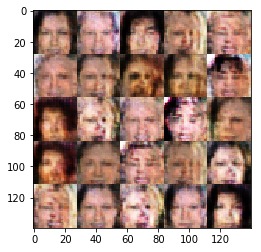

Step 2710... Epoch 3/10... Discriminator Loss: 1.0303... Generator Loss: 2.9526
Step 2720... Epoch 3/10... Discriminator Loss: 1.5192... Generator Loss: 3.1905
Step 2730... Epoch 3/10... Discriminator Loss: 1.9909... Generator Loss: 0.2296
Step 2740... Epoch 3/10... Discriminator Loss: 1.0249... Generator Loss: 1.7853
Step 2750... Epoch 3/10... Discriminator Loss: 1.5124... Generator Loss: 3.1225
Step 2760... Epoch 3/10... Discriminator Loss: 1.5315... Generator Loss: 0.5205
Step 2770... Epoch 3/10... Discriminator Loss: 1.1959... Generator Loss: 0.7970
Step 2780... Epoch 3/10... Discriminator Loss: 0.6393... Generator Loss: 1.2673
Step 2790... Epoch 3/10... Discriminator Loss: 1.8537... Generator Loss: 0.3569
Step 2800... Epoch 3/10... Discriminator Loss: 1.1880... Generator Loss: 0.6128


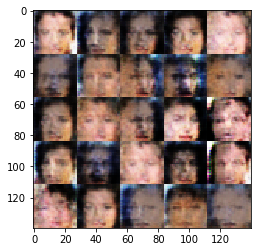

Step 2810... Epoch 3/10... Discriminator Loss: 0.6997... Generator Loss: 1.1771
Step 2820... Epoch 3/10... Discriminator Loss: 0.7839... Generator Loss: 1.3020
Step 2830... Epoch 3/10... Discriminator Loss: 0.9544... Generator Loss: 0.9033
Step 2840... Epoch 3/10... Discriminator Loss: 1.0620... Generator Loss: 0.7107
Step 2850... Epoch 3/10... Discriminator Loss: 1.1735... Generator Loss: 0.5619
Step 2860... Epoch 3/10... Discriminator Loss: 0.4522... Generator Loss: 1.5776
Step 2870... Epoch 3/10... Discriminator Loss: 1.2822... Generator Loss: 1.6351
Step 2880... Epoch 3/10... Discriminator Loss: 0.9132... Generator Loss: 0.7616
Step 2890... Epoch 3/10... Discriminator Loss: 1.2203... Generator Loss: 0.8022
Step 2900... Epoch 3/10... Discriminator Loss: 0.7041... Generator Loss: 1.8150


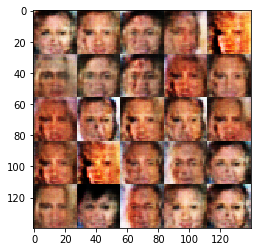

Step 2910... Epoch 3/10... Discriminator Loss: 0.7579... Generator Loss: 2.7241
Step 2920... Epoch 3/10... Discriminator Loss: 0.9309... Generator Loss: 1.2382
Step 2930... Epoch 3/10... Discriminator Loss: 0.7227... Generator Loss: 1.6708
Step 2940... Epoch 3/10... Discriminator Loss: 1.0142... Generator Loss: 2.2368
Step 2950... Epoch 3/10... Discriminator Loss: 1.0920... Generator Loss: 0.6461
Step 2960... Epoch 3/10... Discriminator Loss: 0.9316... Generator Loss: 2.5927
Step 2970... Epoch 3/10... Discriminator Loss: 1.4383... Generator Loss: 2.9299
Step 2980... Epoch 3/10... Discriminator Loss: 1.1249... Generator Loss: 0.8460
Step 2990... Epoch 3/10... Discriminator Loss: 0.8795... Generator Loss: 1.1086
Step 3000... Epoch 3/10... Discriminator Loss: 1.4217... Generator Loss: 2.0242


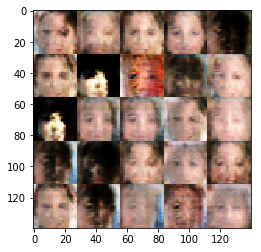

Step 3010... Epoch 3/10... Discriminator Loss: 0.9765... Generator Loss: 1.3677
Step 3020... Epoch 3/10... Discriminator Loss: 0.8372... Generator Loss: 1.0277
Step 3030... Epoch 3/10... Discriminator Loss: 1.5174... Generator Loss: 0.3957
Step 3040... Epoch 4/10... Discriminator Loss: 1.1100... Generator Loss: 2.9643
Step 3050... Epoch 4/10... Discriminator Loss: 0.6378... Generator Loss: 1.1351
Step 3060... Epoch 4/10... Discriminator Loss: 1.4701... Generator Loss: 0.4601
Step 3070... Epoch 4/10... Discriminator Loss: 0.4323... Generator Loss: 1.9109
Step 3080... Epoch 4/10... Discriminator Loss: 1.0642... Generator Loss: 1.2907
Step 3090... Epoch 4/10... Discriminator Loss: 0.7779... Generator Loss: 2.1783
Step 3100... Epoch 4/10... Discriminator Loss: 1.6285... Generator Loss: 3.2273


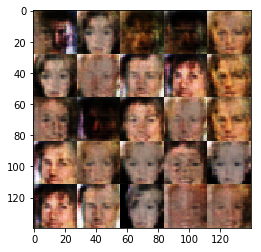

Step 3110... Epoch 4/10... Discriminator Loss: 0.9483... Generator Loss: 0.7734
Step 3120... Epoch 4/10... Discriminator Loss: 4.2031... Generator Loss: 4.5961
Step 3130... Epoch 4/10... Discriminator Loss: 0.8440... Generator Loss: 2.2125
Step 3140... Epoch 4/10... Discriminator Loss: 0.9215... Generator Loss: 0.7305
Step 3150... Epoch 4/10... Discriminator Loss: 0.8638... Generator Loss: 1.0437
Step 3160... Epoch 4/10... Discriminator Loss: 0.7712... Generator Loss: 2.2063
Step 3170... Epoch 4/10... Discriminator Loss: 1.1120... Generator Loss: 0.5983
Step 3180... Epoch 4/10... Discriminator Loss: 0.7170... Generator Loss: 1.1667
Step 3190... Epoch 4/10... Discriminator Loss: 1.4433... Generator Loss: 3.0989
Step 3200... Epoch 4/10... Discriminator Loss: 0.9856... Generator Loss: 1.9122


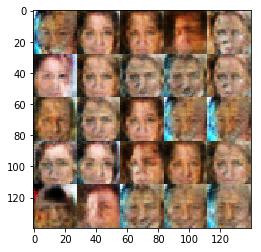

Step 3210... Epoch 4/10... Discriminator Loss: 1.3537... Generator Loss: 0.5926
Step 3220... Epoch 4/10... Discriminator Loss: 2.0781... Generator Loss: 0.2332
Step 3230... Epoch 4/10... Discriminator Loss: 1.0923... Generator Loss: 2.7593
Step 3240... Epoch 4/10... Discriminator Loss: 1.2464... Generator Loss: 3.4772
Step 3250... Epoch 4/10... Discriminator Loss: 0.9673... Generator Loss: 1.2065
Step 3260... Epoch 4/10... Discriminator Loss: 1.0497... Generator Loss: 2.4663
Step 3270... Epoch 4/10... Discriminator Loss: 1.0401... Generator Loss: 0.9190
Step 3280... Epoch 4/10... Discriminator Loss: 1.3395... Generator Loss: 0.4442
Step 3290... Epoch 4/10... Discriminator Loss: 1.2972... Generator Loss: 2.7076
Step 3300... Epoch 4/10... Discriminator Loss: 1.2608... Generator Loss: 0.5044


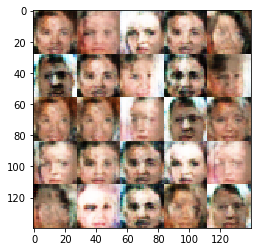

Step 3310... Epoch 4/10... Discriminator Loss: 1.0099... Generator Loss: 0.7578
Step 3320... Epoch 4/10... Discriminator Loss: 1.6834... Generator Loss: 3.3384
Step 3330... Epoch 4/10... Discriminator Loss: 0.6975... Generator Loss: 2.5425
Step 3340... Epoch 4/10... Discriminator Loss: 1.3373... Generator Loss: 0.4695
Step 3350... Epoch 4/10... Discriminator Loss: 2.0377... Generator Loss: 4.1051
Step 3360... Epoch 4/10... Discriminator Loss: 0.6887... Generator Loss: 2.2192
Step 3370... Epoch 4/10... Discriminator Loss: 1.0081... Generator Loss: 0.7584
Step 3380... Epoch 4/10... Discriminator Loss: 0.6125... Generator Loss: 1.9495
Step 3390... Epoch 4/10... Discriminator Loss: 1.1327... Generator Loss: 0.6359
Step 3400... Epoch 4/10... Discriminator Loss: 0.4824... Generator Loss: 1.7115


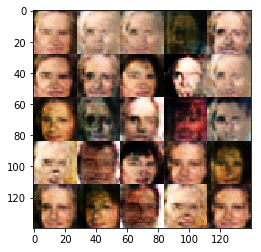

Step 3410... Epoch 4/10... Discriminator Loss: 1.1562... Generator Loss: 1.9142
Step 3420... Epoch 4/10... Discriminator Loss: 0.8408... Generator Loss: 2.0686
Step 3430... Epoch 4/10... Discriminator Loss: 0.7525... Generator Loss: 0.9344
Step 3440... Epoch 4/10... Discriminator Loss: 0.9402... Generator Loss: 1.6475
Step 3450... Epoch 4/10... Discriminator Loss: 1.3143... Generator Loss: 0.7217
Step 3460... Epoch 4/10... Discriminator Loss: 0.8254... Generator Loss: 1.8218
Step 3470... Epoch 4/10... Discriminator Loss: 0.6979... Generator Loss: 1.1615
Step 3480... Epoch 4/10... Discriminator Loss: 0.7994... Generator Loss: 2.4339
Step 3490... Epoch 4/10... Discriminator Loss: 0.6103... Generator Loss: 2.3668
Step 3500... Epoch 4/10... Discriminator Loss: 0.5730... Generator Loss: 2.1913


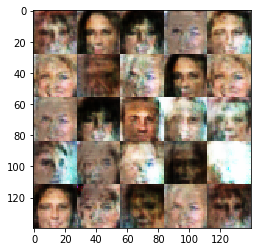

Step 3510... Epoch 4/10... Discriminator Loss: 1.0752... Generator Loss: 0.7757
Step 3520... Epoch 4/10... Discriminator Loss: 2.1076... Generator Loss: 0.2067
Step 3530... Epoch 4/10... Discriminator Loss: 0.7659... Generator Loss: 1.3637
Step 3540... Epoch 4/10... Discriminator Loss: 0.8597... Generator Loss: 1.9489
Step 3550... Epoch 4/10... Discriminator Loss: 1.1498... Generator Loss: 0.5954
Step 3560... Epoch 4/10... Discriminator Loss: 1.0492... Generator Loss: 2.5865
Step 3570... Epoch 4/10... Discriminator Loss: 1.0078... Generator Loss: 0.8324
Step 3580... Epoch 4/10... Discriminator Loss: 1.0947... Generator Loss: 1.9364
Step 3590... Epoch 4/10... Discriminator Loss: 1.1642... Generator Loss: 3.2358
Step 3600... Epoch 4/10... Discriminator Loss: 0.6435... Generator Loss: 1.4566


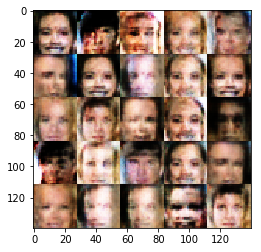

Step 3610... Epoch 4/10... Discriminator Loss: 2.2640... Generator Loss: 0.1985
Step 3620... Epoch 4/10... Discriminator Loss: 1.4547... Generator Loss: 0.3982
Step 3630... Epoch 4/10... Discriminator Loss: 1.0182... Generator Loss: 2.8190
Step 3640... Epoch 4/10... Discriminator Loss: 1.0428... Generator Loss: 2.3382
Step 3650... Epoch 4/10... Discriminator Loss: 0.8667... Generator Loss: 1.5428
Step 3660... Epoch 4/10... Discriminator Loss: 1.3877... Generator Loss: 0.6017
Step 3670... Epoch 4/10... Discriminator Loss: 1.1326... Generator Loss: 2.7519
Step 3680... Epoch 4/10... Discriminator Loss: 0.9065... Generator Loss: 1.7897
Step 3690... Epoch 4/10... Discriminator Loss: 1.7103... Generator Loss: 3.5126
Step 3700... Epoch 4/10... Discriminator Loss: 1.3658... Generator Loss: 3.0739


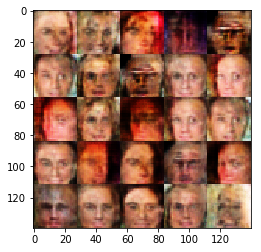

Step 3710... Epoch 4/10... Discriminator Loss: 1.0250... Generator Loss: 0.7968
Step 3720... Epoch 4/10... Discriminator Loss: 0.9059... Generator Loss: 1.0976
Step 3730... Epoch 4/10... Discriminator Loss: 1.9101... Generator Loss: 0.2730
Step 3740... Epoch 4/10... Discriminator Loss: 0.7783... Generator Loss: 1.4790
Step 3750... Epoch 4/10... Discriminator Loss: 0.8506... Generator Loss: 1.7872
Step 3760... Epoch 4/10... Discriminator Loss: 0.9284... Generator Loss: 1.6300
Step 3770... Epoch 4/10... Discriminator Loss: 0.8350... Generator Loss: 0.8028
Step 3780... Epoch 4/10... Discriminator Loss: 1.2202... Generator Loss: 3.1022
Step 3790... Epoch 4/10... Discriminator Loss: 1.2180... Generator Loss: 0.5557
Step 3800... Epoch 4/10... Discriminator Loss: 0.7022... Generator Loss: 1.0973


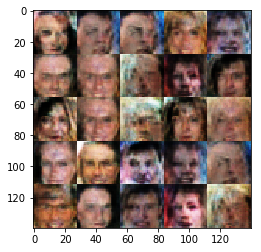

Step 3810... Epoch 4/10... Discriminator Loss: 1.5834... Generator Loss: 0.3906
Step 3820... Epoch 4/10... Discriminator Loss: 0.9568... Generator Loss: 0.7928
Step 3830... Epoch 4/10... Discriminator Loss: 1.1229... Generator Loss: 3.4371
Step 3840... Epoch 4/10... Discriminator Loss: 1.1010... Generator Loss: 2.2677
Step 3850... Epoch 4/10... Discriminator Loss: 0.9676... Generator Loss: 0.7300
Step 3860... Epoch 4/10... Discriminator Loss: 0.7425... Generator Loss: 1.3630
Step 3870... Epoch 4/10... Discriminator Loss: 0.9537... Generator Loss: 1.1081
Step 3880... Epoch 4/10... Discriminator Loss: 0.9564... Generator Loss: 1.1080
Step 3890... Epoch 4/10... Discriminator Loss: 0.8845... Generator Loss: 1.4711
Step 3900... Epoch 4/10... Discriminator Loss: 1.0809... Generator Loss: 0.6819


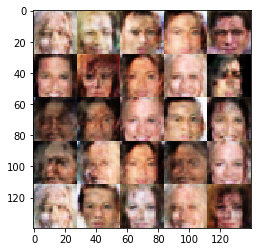

Step 3910... Epoch 4/10... Discriminator Loss: 0.9365... Generator Loss: 1.7388
Step 3920... Epoch 4/10... Discriminator Loss: 1.5335... Generator Loss: 3.1963
Step 3930... Epoch 4/10... Discriminator Loss: 1.0803... Generator Loss: 1.4775
Step 3940... Epoch 4/10... Discriminator Loss: 1.2091... Generator Loss: 2.5596
Step 3950... Epoch 4/10... Discriminator Loss: 0.8847... Generator Loss: 1.1491
Step 3960... Epoch 4/10... Discriminator Loss: 1.3957... Generator Loss: 0.4325
Step 3970... Epoch 4/10... Discriminator Loss: 1.3438... Generator Loss: 0.4934
Step 3980... Epoch 4/10... Discriminator Loss: 1.3007... Generator Loss: 3.4858
Step 3990... Epoch 4/10... Discriminator Loss: 0.8396... Generator Loss: 2.1762
Step 4000... Epoch 4/10... Discriminator Loss: 0.8054... Generator Loss: 0.9733


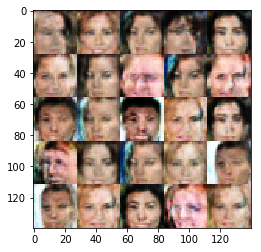

Step 4010... Epoch 4/10... Discriminator Loss: 1.7981... Generator Loss: 0.3170
Step 4020... Epoch 4/10... Discriminator Loss: 0.7904... Generator Loss: 2.4881
Step 4030... Epoch 4/10... Discriminator Loss: 0.8530... Generator Loss: 2.1392
Step 4040... Epoch 4/10... Discriminator Loss: 1.1344... Generator Loss: 0.5962
Step 4050... Epoch 5/10... Discriminator Loss: 0.3045... Generator Loss: 1.8725
Step 4060... Epoch 5/10... Discriminator Loss: 0.6966... Generator Loss: 1.1947
Step 4070... Epoch 5/10... Discriminator Loss: 0.7702... Generator Loss: 1.5937
Step 4080... Epoch 5/10... Discriminator Loss: 0.9889... Generator Loss: 1.3223
Step 4090... Epoch 5/10... Discriminator Loss: 1.0526... Generator Loss: 1.1560
Step 4100... Epoch 5/10... Discriminator Loss: 0.5941... Generator Loss: 2.0660


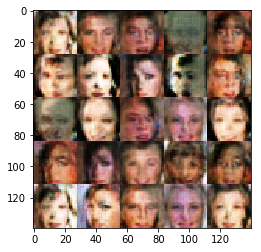

Step 4110... Epoch 5/10... Discriminator Loss: 1.5108... Generator Loss: 2.8058
Step 4120... Epoch 5/10... Discriminator Loss: 1.4206... Generator Loss: 0.4466
Step 4130... Epoch 5/10... Discriminator Loss: 0.7758... Generator Loss: 1.2522
Step 4140... Epoch 5/10... Discriminator Loss: 1.0550... Generator Loss: 0.7820
Step 4150... Epoch 5/10... Discriminator Loss: 0.7836... Generator Loss: 1.9901
Step 4160... Epoch 5/10... Discriminator Loss: 1.4855... Generator Loss: 3.5240
Step 4170... Epoch 5/10... Discriminator Loss: 1.6951... Generator Loss: 0.3605
Step 4180... Epoch 5/10... Discriminator Loss: 1.0864... Generator Loss: 0.6797
Step 4190... Epoch 5/10... Discriminator Loss: 1.4024... Generator Loss: 0.4833
Step 4200... Epoch 5/10... Discriminator Loss: 1.1860... Generator Loss: 0.7105


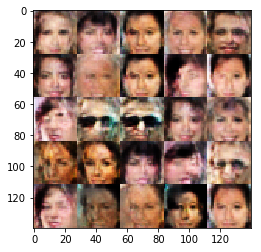

Step 4210... Epoch 5/10... Discriminator Loss: 0.8363... Generator Loss: 1.2381
Step 4220... Epoch 5/10... Discriminator Loss: 1.0759... Generator Loss: 0.6684
Step 4230... Epoch 5/10... Discriminator Loss: 1.1135... Generator Loss: 0.5780
Step 4240... Epoch 5/10... Discriminator Loss: 1.4671... Generator Loss: 0.4140
Step 4250... Epoch 5/10... Discriminator Loss: 0.9709... Generator Loss: 0.7171
Step 4260... Epoch 5/10... Discriminator Loss: 1.1828... Generator Loss: 0.5502
Step 4270... Epoch 5/10... Discriminator Loss: 2.3089... Generator Loss: 0.2094
Step 4280... Epoch 5/10... Discriminator Loss: 1.7908... Generator Loss: 0.3258
Step 4290... Epoch 5/10... Discriminator Loss: 1.0053... Generator Loss: 1.3655
Step 4300... Epoch 5/10... Discriminator Loss: 1.8660... Generator Loss: 0.3077


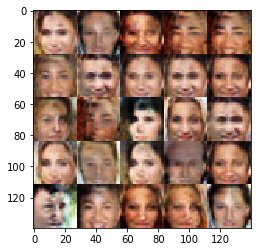

Step 4310... Epoch 5/10... Discriminator Loss: 0.8387... Generator Loss: 1.7915
Step 4320... Epoch 5/10... Discriminator Loss: 1.7828... Generator Loss: 3.2502
Step 4330... Epoch 5/10... Discriminator Loss: 1.2158... Generator Loss: 0.5578
Step 4340... Epoch 5/10... Discriminator Loss: 1.9001... Generator Loss: 0.2520
Step 4350... Epoch 5/10... Discriminator Loss: 1.6373... Generator Loss: 0.3442
Step 4360... Epoch 5/10... Discriminator Loss: 1.3834... Generator Loss: 0.3984
Step 4370... Epoch 5/10... Discriminator Loss: 0.8640... Generator Loss: 1.6555
Step 4380... Epoch 5/10... Discriminator Loss: 1.0794... Generator Loss: 2.4038
Step 4390... Epoch 5/10... Discriminator Loss: 1.0383... Generator Loss: 2.6400
Step 4400... Epoch 5/10... Discriminator Loss: 1.3241... Generator Loss: 2.6460


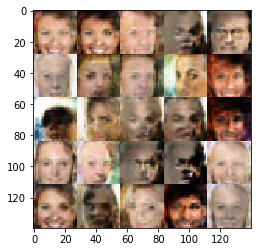

Step 4410... Epoch 5/10... Discriminator Loss: 1.6390... Generator Loss: 0.3551
Step 4420... Epoch 5/10... Discriminator Loss: 1.1832... Generator Loss: 0.7255
Step 4430... Epoch 5/10... Discriminator Loss: 1.5075... Generator Loss: 3.4179
Step 4440... Epoch 5/10... Discriminator Loss: 0.8145... Generator Loss: 1.3216
Step 4450... Epoch 5/10... Discriminator Loss: 1.4895... Generator Loss: 3.2298
Step 4460... Epoch 5/10... Discriminator Loss: 1.3439... Generator Loss: 0.5312
Step 4470... Epoch 5/10... Discriminator Loss: 0.6314... Generator Loss: 1.1786
Step 4480... Epoch 5/10... Discriminator Loss: 0.8479... Generator Loss: 1.0418
Step 4490... Epoch 5/10... Discriminator Loss: 0.9053... Generator Loss: 0.8559
Step 4500... Epoch 5/10... Discriminator Loss: 1.1468... Generator Loss: 0.6231


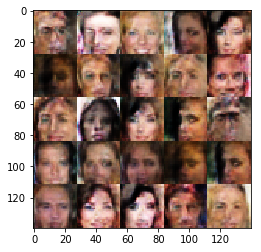

Step 4510... Epoch 5/10... Discriminator Loss: 1.3984... Generator Loss: 3.2911
Step 4520... Epoch 5/10... Discriminator Loss: 1.6165... Generator Loss: 0.3487
Step 4530... Epoch 5/10... Discriminator Loss: 2.7187... Generator Loss: 4.3815
Step 4540... Epoch 5/10... Discriminator Loss: 1.2338... Generator Loss: 2.7731
Step 4550... Epoch 5/10... Discriminator Loss: 0.7714... Generator Loss: 1.7931
Step 4560... Epoch 5/10... Discriminator Loss: 1.1224... Generator Loss: 0.5677
Step 4570... Epoch 5/10... Discriminator Loss: 0.9585... Generator Loss: 0.8731
Step 4580... Epoch 5/10... Discriminator Loss: 0.9842... Generator Loss: 1.1783
Step 4590... Epoch 5/10... Discriminator Loss: 1.0491... Generator Loss: 2.8873
Step 4600... Epoch 5/10... Discriminator Loss: 1.1990... Generator Loss: 0.5819


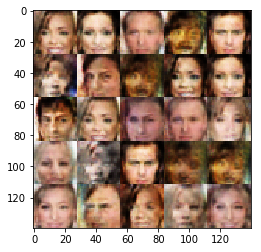

Step 4610... Epoch 5/10... Discriminator Loss: 1.7693... Generator Loss: 0.2853
Step 4620... Epoch 5/10... Discriminator Loss: 1.0698... Generator Loss: 0.6061
Step 4630... Epoch 5/10... Discriminator Loss: 1.3400... Generator Loss: 0.5463
Step 4640... Epoch 5/10... Discriminator Loss: 1.0335... Generator Loss: 1.3700
Step 4650... Epoch 5/10... Discriminator Loss: 2.1913... Generator Loss: 0.2172
Step 4660... Epoch 5/10... Discriminator Loss: 1.7324... Generator Loss: 0.3525
Step 4670... Epoch 5/10... Discriminator Loss: 0.7456... Generator Loss: 0.9767
Step 4680... Epoch 5/10... Discriminator Loss: 1.0385... Generator Loss: 2.1382
Step 4690... Epoch 5/10... Discriminator Loss: 1.7405... Generator Loss: 0.3639
Step 4700... Epoch 5/10... Discriminator Loss: 1.3852... Generator Loss: 3.3488


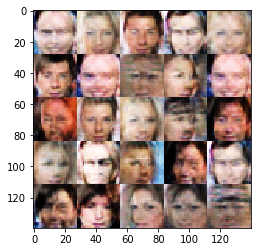

Step 4710... Epoch 5/10... Discriminator Loss: 1.9706... Generator Loss: 0.2492
Step 4720... Epoch 5/10... Discriminator Loss: 0.8744... Generator Loss: 0.8026
Step 4730... Epoch 5/10... Discriminator Loss: 1.2321... Generator Loss: 0.6117
Step 4740... Epoch 5/10... Discriminator Loss: 1.2549... Generator Loss: 0.5695
Step 4750... Epoch 5/10... Discriminator Loss: 0.6961... Generator Loss: 1.3978
Step 4760... Epoch 5/10... Discriminator Loss: 1.4735... Generator Loss: 0.3854
Step 4770... Epoch 5/10... Discriminator Loss: 0.8110... Generator Loss: 1.6519
Step 4780... Epoch 5/10... Discriminator Loss: 1.5381... Generator Loss: 0.3916
Step 4790... Epoch 5/10... Discriminator Loss: 0.8565... Generator Loss: 2.2456
Step 4800... Epoch 5/10... Discriminator Loss: 0.8776... Generator Loss: 1.2733


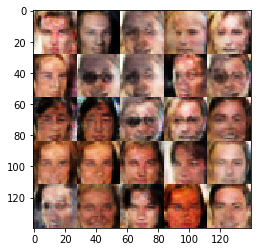

Step 4810... Epoch 5/10... Discriminator Loss: 0.7741... Generator Loss: 2.8449
Step 4820... Epoch 5/10... Discriminator Loss: 1.8447... Generator Loss: 4.1313
Step 4830... Epoch 5/10... Discriminator Loss: 1.1521... Generator Loss: 0.5994
Step 4840... Epoch 5/10... Discriminator Loss: 0.8684... Generator Loss: 1.7240
Step 4850... Epoch 5/10... Discriminator Loss: 0.7537... Generator Loss: 1.3574
Step 4860... Epoch 5/10... Discriminator Loss: 1.5280... Generator Loss: 0.4785
Step 4870... Epoch 5/10... Discriminator Loss: 1.5396... Generator Loss: 0.3673
Step 4880... Epoch 5/10... Discriminator Loss: 2.9671... Generator Loss: 4.3064
Step 4890... Epoch 5/10... Discriminator Loss: 1.1726... Generator Loss: 0.7028
Step 4900... Epoch 5/10... Discriminator Loss: 0.9224... Generator Loss: 0.9843


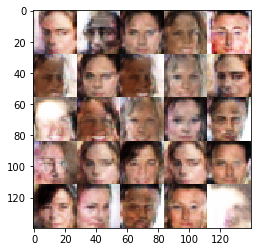

Step 4910... Epoch 5/10... Discriminator Loss: 1.1221... Generator Loss: 3.0909
Step 4920... Epoch 5/10... Discriminator Loss: 1.7238... Generator Loss: 3.4849
Step 4930... Epoch 5/10... Discriminator Loss: 0.8628... Generator Loss: 1.3467
Step 4940... Epoch 5/10... Discriminator Loss: 1.4316... Generator Loss: 0.3960
Step 4950... Epoch 5/10... Discriminator Loss: 0.7509... Generator Loss: 1.8535
Step 4960... Epoch 5/10... Discriminator Loss: 0.8680... Generator Loss: 2.1900
Step 4970... Epoch 5/10... Discriminator Loss: 0.8095... Generator Loss: 1.3211
Step 4980... Epoch 5/10... Discriminator Loss: 0.9682... Generator Loss: 2.2112
Step 4990... Epoch 5/10... Discriminator Loss: 0.7276... Generator Loss: 1.9707
Step 5000... Epoch 5/10... Discriminator Loss: 1.6959... Generator Loss: 3.9025


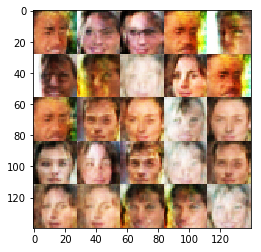

Step 5010... Epoch 5/10... Discriminator Loss: 0.6827... Generator Loss: 1.9844
Step 5020... Epoch 5/10... Discriminator Loss: 1.1276... Generator Loss: 0.6107
Step 5030... Epoch 5/10... Discriminator Loss: 1.0051... Generator Loss: 0.7309
Step 5040... Epoch 5/10... Discriminator Loss: 0.9194... Generator Loss: 0.8147
Step 5050... Epoch 5/10... Discriminator Loss: 1.2843... Generator Loss: 0.4854
Step 5060... Epoch 5/10... Discriminator Loss: 0.8538... Generator Loss: 0.9822
Step 5070... Epoch 6/10... Discriminator Loss: 0.9901... Generator Loss: 0.6535
Step 5080... Epoch 6/10... Discriminator Loss: 1.1054... Generator Loss: 0.6915
Step 5090... Epoch 6/10... Discriminator Loss: 1.1828... Generator Loss: 0.6303
Step 5100... Epoch 6/10... Discriminator Loss: 1.1573... Generator Loss: 2.8838


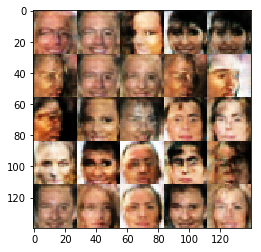

Step 5110... Epoch 6/10... Discriminator Loss: 0.5980... Generator Loss: 2.3914
Step 5120... Epoch 6/10... Discriminator Loss: 1.5307... Generator Loss: 0.3439
Step 5130... Epoch 6/10... Discriminator Loss: 0.8706... Generator Loss: 0.7909
Step 5140... Epoch 6/10... Discriminator Loss: 2.4851... Generator Loss: 0.1586
Step 5150... Epoch 6/10... Discriminator Loss: 1.0209... Generator Loss: 0.7352
Step 5160... Epoch 6/10... Discriminator Loss: 1.3867... Generator Loss: 3.4412
Step 5170... Epoch 6/10... Discriminator Loss: 0.8741... Generator Loss: 0.7906
Step 5180... Epoch 6/10... Discriminator Loss: 1.0006... Generator Loss: 2.3700
Step 5190... Epoch 6/10... Discriminator Loss: 1.6459... Generator Loss: 3.9024
Step 5200... Epoch 6/10... Discriminator Loss: 1.2286... Generator Loss: 2.8788


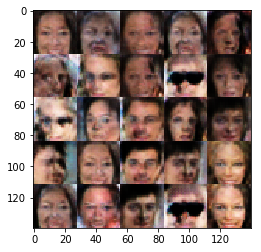

Step 5210... Epoch 6/10... Discriminator Loss: 1.0010... Generator Loss: 0.8139
Step 5220... Epoch 6/10... Discriminator Loss: 0.9334... Generator Loss: 1.6232
Step 5230... Epoch 6/10... Discriminator Loss: 0.7300... Generator Loss: 1.6268
Step 5240... Epoch 6/10... Discriminator Loss: 1.0472... Generator Loss: 1.0308
Step 5250... Epoch 6/10... Discriminator Loss: 1.1949... Generator Loss: 3.6461
Step 5260... Epoch 6/10... Discriminator Loss: 1.0493... Generator Loss: 2.8249
Step 5270... Epoch 6/10... Discriminator Loss: 0.9037... Generator Loss: 0.7379
Step 5280... Epoch 6/10... Discriminator Loss: 0.9032... Generator Loss: 1.2241
Step 5290... Epoch 6/10... Discriminator Loss: 1.3889... Generator Loss: 0.4407
Step 5300... Epoch 6/10... Discriminator Loss: 1.3905... Generator Loss: 3.6288


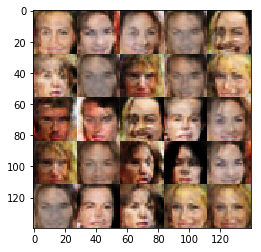

Step 5310... Epoch 6/10... Discriminator Loss: 1.0194... Generator Loss: 0.6932
Step 5320... Epoch 6/10... Discriminator Loss: 1.6917... Generator Loss: 0.3462
Step 5330... Epoch 6/10... Discriminator Loss: 0.4577... Generator Loss: 1.4753
Step 5340... Epoch 6/10... Discriminator Loss: 1.0892... Generator Loss: 0.5693
Step 5350... Epoch 6/10... Discriminator Loss: 0.7600... Generator Loss: 2.0877
Step 5360... Epoch 6/10... Discriminator Loss: 0.7673... Generator Loss: 1.7252
Step 5370... Epoch 6/10... Discriminator Loss: 1.5588... Generator Loss: 0.3509
Step 5380... Epoch 6/10... Discriminator Loss: 1.4071... Generator Loss: 0.4382
Step 5390... Epoch 6/10... Discriminator Loss: 1.8572... Generator Loss: 0.2702
Step 5400... Epoch 6/10... Discriminator Loss: 0.7656... Generator Loss: 1.0422


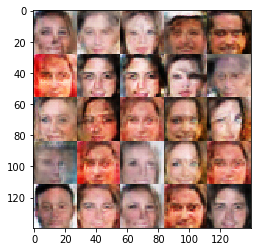

Step 5410... Epoch 6/10... Discriminator Loss: 1.2368... Generator Loss: 0.5437
Step 5420... Epoch 6/10... Discriminator Loss: 0.7510... Generator Loss: 1.5315
Step 5430... Epoch 6/10... Discriminator Loss: 0.9222... Generator Loss: 0.8636
Step 5440... Epoch 6/10... Discriminator Loss: 0.8701... Generator Loss: 1.5960
Step 5450... Epoch 6/10... Discriminator Loss: 1.6156... Generator Loss: 0.3898
Step 5460... Epoch 6/10... Discriminator Loss: 2.0726... Generator Loss: 0.2431
Step 5470... Epoch 6/10... Discriminator Loss: 1.4723... Generator Loss: 0.3916
Step 5480... Epoch 6/10... Discriminator Loss: 0.7838... Generator Loss: 1.2053
Step 5490... Epoch 6/10... Discriminator Loss: 0.7951... Generator Loss: 1.0123
Step 5500... Epoch 6/10... Discriminator Loss: 0.7944... Generator Loss: 1.2905


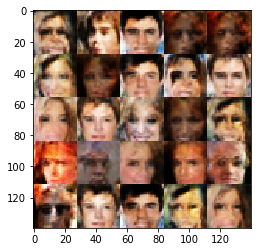

Step 5510... Epoch 6/10... Discriminator Loss: 0.8547... Generator Loss: 1.8902
Step 5520... Epoch 6/10... Discriminator Loss: 1.7199... Generator Loss: 0.2987
Step 5530... Epoch 6/10... Discriminator Loss: 2.2144... Generator Loss: 3.4060
Step 5540... Epoch 6/10... Discriminator Loss: 0.7902... Generator Loss: 2.4905
Step 5550... Epoch 6/10... Discriminator Loss: 0.6618... Generator Loss: 1.2798
Step 5560... Epoch 6/10... Discriminator Loss: 0.9701... Generator Loss: 0.8336
Step 5570... Epoch 6/10... Discriminator Loss: 1.0021... Generator Loss: 0.7411
Step 5580... Epoch 6/10... Discriminator Loss: 1.0202... Generator Loss: 0.9408
Step 5590... Epoch 6/10... Discriminator Loss: 0.8809... Generator Loss: 0.9143
Step 5600... Epoch 6/10... Discriminator Loss: 1.4585... Generator Loss: 0.4152


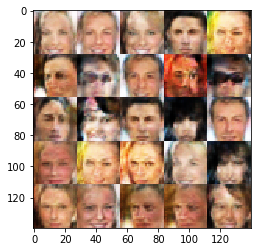

Step 5610... Epoch 6/10... Discriminator Loss: 0.8794... Generator Loss: 0.7433
Step 5620... Epoch 6/10... Discriminator Loss: 0.7500... Generator Loss: 1.7384
Step 5630... Epoch 6/10... Discriminator Loss: 1.5492... Generator Loss: 0.3462
Step 5640... Epoch 6/10... Discriminator Loss: 2.1454... Generator Loss: 0.2155
Step 5650... Epoch 6/10... Discriminator Loss: 1.0458... Generator Loss: 0.7610
Step 5660... Epoch 6/10... Discriminator Loss: 0.9746... Generator Loss: 1.1371
Step 5670... Epoch 6/10... Discriminator Loss: 0.7596... Generator Loss: 1.4129
Step 5680... Epoch 6/10... Discriminator Loss: 0.7450... Generator Loss: 1.3340
Step 5690... Epoch 6/10... Discriminator Loss: 0.8898... Generator Loss: 0.7747
Step 5700... Epoch 6/10... Discriminator Loss: 0.6329... Generator Loss: 2.1319


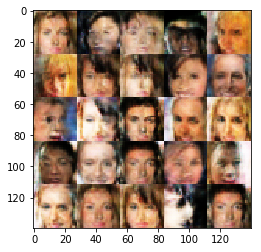

Step 5710... Epoch 6/10... Discriminator Loss: 1.9218... Generator Loss: 0.2541
Step 5720... Epoch 6/10... Discriminator Loss: 1.3377... Generator Loss: 0.4396
Step 5730... Epoch 6/10... Discriminator Loss: 0.7237... Generator Loss: 1.5971
Step 5740... Epoch 6/10... Discriminator Loss: 0.9497... Generator Loss: 2.9962
Step 5750... Epoch 6/10... Discriminator Loss: 1.1136... Generator Loss: 0.7139
Step 5760... Epoch 6/10... Discriminator Loss: 1.5366... Generator Loss: 0.3614
Step 5770... Epoch 6/10... Discriminator Loss: 1.3470... Generator Loss: 0.4422
Step 5780... Epoch 6/10... Discriminator Loss: 1.8505... Generator Loss: 4.4198
Step 5790... Epoch 6/10... Discriminator Loss: 0.6889... Generator Loss: 1.6813
Step 5800... Epoch 6/10... Discriminator Loss: 0.9957... Generator Loss: 0.7298


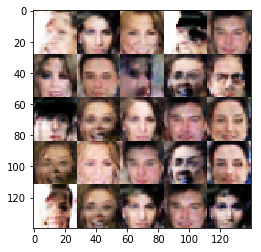

Step 5810... Epoch 6/10... Discriminator Loss: 1.1330... Generator Loss: 0.6717
Step 5820... Epoch 6/10... Discriminator Loss: 0.8613... Generator Loss: 0.8778
Step 5830... Epoch 6/10... Discriminator Loss: 0.9798... Generator Loss: 0.7047
Step 5840... Epoch 6/10... Discriminator Loss: 1.7835... Generator Loss: 0.2975
Step 5850... Epoch 6/10... Discriminator Loss: 1.1978... Generator Loss: 0.5558
Step 5860... Epoch 6/10... Discriminator Loss: 0.8888... Generator Loss: 0.8189
Step 5870... Epoch 6/10... Discriminator Loss: 1.2347... Generator Loss: 0.4769
Step 5880... Epoch 6/10... Discriminator Loss: 1.5798... Generator Loss: 0.3868
Step 5890... Epoch 6/10... Discriminator Loss: 0.8846... Generator Loss: 1.1130
Step 5900... Epoch 6/10... Discriminator Loss: 1.1349... Generator Loss: 0.5376


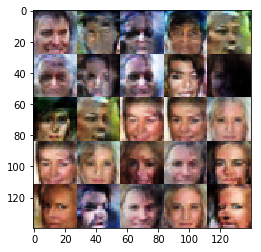

Step 5910... Epoch 6/10... Discriminator Loss: 0.9147... Generator Loss: 0.7808
Step 5920... Epoch 6/10... Discriminator Loss: 1.3147... Generator Loss: 0.4520
Step 5930... Epoch 6/10... Discriminator Loss: 1.6082... Generator Loss: 3.4969
Step 5940... Epoch 6/10... Discriminator Loss: 0.9760... Generator Loss: 2.6075
Step 5950... Epoch 6/10... Discriminator Loss: 0.7883... Generator Loss: 1.6588
Step 5960... Epoch 6/10... Discriminator Loss: 1.6669... Generator Loss: 0.3046
Step 5970... Epoch 6/10... Discriminator Loss: 1.6884... Generator Loss: 0.3438
Step 5980... Epoch 6/10... Discriminator Loss: 0.9938... Generator Loss: 0.6580
Step 5990... Epoch 6/10... Discriminator Loss: 1.6801... Generator Loss: 0.3672
Step 6000... Epoch 6/10... Discriminator Loss: 0.7527... Generator Loss: 2.0670


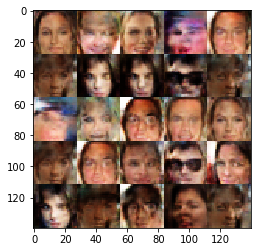

Step 6010... Epoch 6/10... Discriminator Loss: 0.8505... Generator Loss: 1.4642
Step 6020... Epoch 6/10... Discriminator Loss: 1.0910... Generator Loss: 1.0247
Step 6030... Epoch 6/10... Discriminator Loss: 1.6180... Generator Loss: 0.3143
Step 6040... Epoch 6/10... Discriminator Loss: 1.4889... Generator Loss: 0.3686
Step 6050... Epoch 6/10... Discriminator Loss: 1.1788... Generator Loss: 0.5005
Step 6060... Epoch 6/10... Discriminator Loss: 1.0447... Generator Loss: 0.6984
Step 6070... Epoch 6/10... Discriminator Loss: 0.9132... Generator Loss: 0.8537
Step 6080... Epoch 7/10... Discriminator Loss: 1.5177... Generator Loss: 0.5466
Step 6090... Epoch 7/10... Discriminator Loss: 0.9273... Generator Loss: 0.8113
Step 6100... Epoch 7/10... Discriminator Loss: 1.0656... Generator Loss: 0.5630


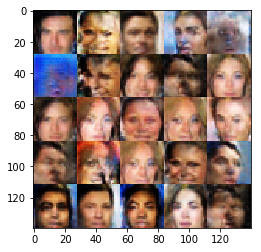

Step 6110... Epoch 7/10... Discriminator Loss: 0.9483... Generator Loss: 0.8594
Step 6120... Epoch 7/10... Discriminator Loss: 0.7819... Generator Loss: 1.8965
Step 6130... Epoch 7/10... Discriminator Loss: 1.1843... Generator Loss: 0.7754
Step 6140... Epoch 7/10... Discriminator Loss: 1.5992... Generator Loss: 0.3330
Step 6150... Epoch 7/10... Discriminator Loss: 1.2477... Generator Loss: 0.5077
Step 6160... Epoch 7/10... Discriminator Loss: 1.1895... Generator Loss: 0.5288
Step 6170... Epoch 7/10... Discriminator Loss: 1.0939... Generator Loss: 0.5922
Step 6180... Epoch 7/10... Discriminator Loss: 1.1926... Generator Loss: 0.5384
Step 6190... Epoch 7/10... Discriminator Loss: 0.9089... Generator Loss: 2.4192
Step 6200... Epoch 7/10... Discriminator Loss: 0.7697... Generator Loss: 2.0780


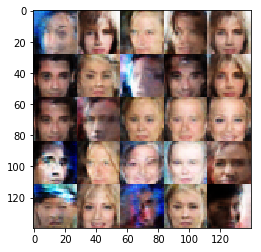

Step 6210... Epoch 7/10... Discriminator Loss: 0.6739... Generator Loss: 2.0135
Step 6220... Epoch 7/10... Discriminator Loss: 1.8258... Generator Loss: 4.3041
Step 6230... Epoch 7/10... Discriminator Loss: 0.8463... Generator Loss: 2.4043
Step 6240... Epoch 7/10... Discriminator Loss: 0.8172... Generator Loss: 2.4750
Step 6250... Epoch 7/10... Discriminator Loss: 1.0206... Generator Loss: 0.6801
Step 6260... Epoch 7/10... Discriminator Loss: 0.7411... Generator Loss: 1.9290
Step 6270... Epoch 7/10... Discriminator Loss: 0.8211... Generator Loss: 1.6769
Step 6280... Epoch 7/10... Discriminator Loss: 0.9925... Generator Loss: 2.7263
Step 6290... Epoch 7/10... Discriminator Loss: 1.0466... Generator Loss: 0.6301
Step 6300... Epoch 7/10... Discriminator Loss: 0.9600... Generator Loss: 2.0754


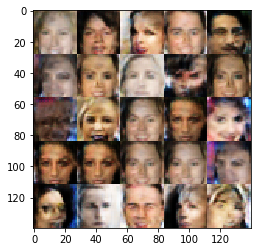

Step 6310... Epoch 7/10... Discriminator Loss: 0.9007... Generator Loss: 0.8148
Step 6320... Epoch 7/10... Discriminator Loss: 0.9324... Generator Loss: 0.8382
Step 6330... Epoch 7/10... Discriminator Loss: 0.7955... Generator Loss: 0.9453
Step 6340... Epoch 7/10... Discriminator Loss: 1.1678... Generator Loss: 0.5481
Step 6350... Epoch 7/10... Discriminator Loss: 1.0236... Generator Loss: 1.0438
Step 6360... Epoch 7/10... Discriminator Loss: 0.8302... Generator Loss: 1.2032
Step 6370... Epoch 7/10... Discriminator Loss: 1.0322... Generator Loss: 2.7666
Step 6380... Epoch 7/10... Discriminator Loss: 1.5976... Generator Loss: 0.3304
Step 6390... Epoch 7/10... Discriminator Loss: 1.3020... Generator Loss: 0.4875
Step 6400... Epoch 7/10... Discriminator Loss: 1.4167... Generator Loss: 0.4144


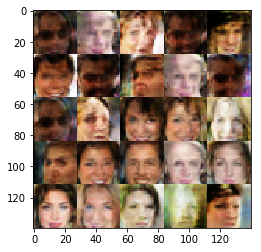

Step 6410... Epoch 7/10... Discriminator Loss: 1.1580... Generator Loss: 0.6263
Step 6420... Epoch 7/10... Discriminator Loss: 0.9025... Generator Loss: 0.8165
Step 6430... Epoch 7/10... Discriminator Loss: 0.6977... Generator Loss: 2.0964
Step 6440... Epoch 7/10... Discriminator Loss: 1.3296... Generator Loss: 3.6192
Step 6450... Epoch 7/10... Discriminator Loss: 0.9372... Generator Loss: 0.7154
Step 6460... Epoch 7/10... Discriminator Loss: 1.4568... Generator Loss: 0.4099
Step 6470... Epoch 7/10... Discriminator Loss: 1.2829... Generator Loss: 0.5376
Step 6480... Epoch 7/10... Discriminator Loss: 1.2398... Generator Loss: 3.1314
Step 6490... Epoch 7/10... Discriminator Loss: 1.7107... Generator Loss: 0.2961
Step 6500... Epoch 7/10... Discriminator Loss: 1.0382... Generator Loss: 0.6687


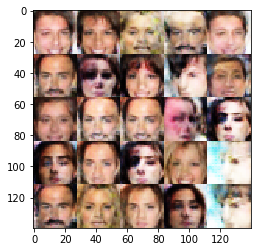

Step 6510... Epoch 7/10... Discriminator Loss: 1.3328... Generator Loss: 2.8225
Step 6520... Epoch 7/10... Discriminator Loss: 1.3564... Generator Loss: 0.4612
Step 6530... Epoch 7/10... Discriminator Loss: 0.8699... Generator Loss: 1.1161
Step 6540... Epoch 7/10... Discriminator Loss: 1.3924... Generator Loss: 3.5246
Step 6550... Epoch 7/10... Discriminator Loss: 0.8388... Generator Loss: 1.0300
Step 6560... Epoch 7/10... Discriminator Loss: 0.8361... Generator Loss: 0.9396
Step 6570... Epoch 7/10... Discriminator Loss: 1.0918... Generator Loss: 2.6915
Step 6580... Epoch 7/10... Discriminator Loss: 1.9691... Generator Loss: 0.2291
Step 6590... Epoch 7/10... Discriminator Loss: 0.7758... Generator Loss: 1.3635
Step 6600... Epoch 7/10... Discriminator Loss: 0.6140... Generator Loss: 1.1586


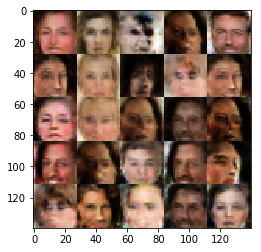

Step 6610... Epoch 7/10... Discriminator Loss: 0.8326... Generator Loss: 2.2093
Step 6620... Epoch 7/10... Discriminator Loss: 0.8513... Generator Loss: 1.7900
Step 6630... Epoch 7/10... Discriminator Loss: 0.7411... Generator Loss: 1.4137
Step 6640... Epoch 7/10... Discriminator Loss: 0.8116... Generator Loss: 2.2592
Step 6650... Epoch 7/10... Discriminator Loss: 0.8870... Generator Loss: 2.4862
Step 6660... Epoch 7/10... Discriminator Loss: 0.7953... Generator Loss: 1.2707
Step 6670... Epoch 7/10... Discriminator Loss: 0.8654... Generator Loss: 2.0936
Step 6680... Epoch 7/10... Discriminator Loss: 0.5840... Generator Loss: 1.7538
Step 6690... Epoch 7/10... Discriminator Loss: 0.7968... Generator Loss: 2.2310
Step 6700... Epoch 7/10... Discriminator Loss: 0.9956... Generator Loss: 0.6804


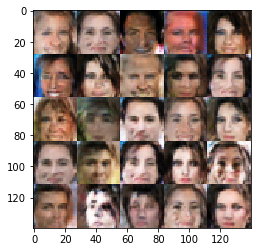

Step 6710... Epoch 7/10... Discriminator Loss: 1.6118... Generator Loss: 0.3347
Step 6720... Epoch 7/10... Discriminator Loss: 1.0890... Generator Loss: 0.5694
Step 6730... Epoch 7/10... Discriminator Loss: 0.6968... Generator Loss: 2.0056
Step 6740... Epoch 7/10... Discriminator Loss: 0.7931... Generator Loss: 2.6980
Step 6750... Epoch 7/10... Discriminator Loss: 0.8335... Generator Loss: 1.1252
Step 6760... Epoch 7/10... Discriminator Loss: 0.6927... Generator Loss: 1.2065
Step 6770... Epoch 7/10... Discriminator Loss: 1.6862... Generator Loss: 0.3006
Step 6780... Epoch 7/10... Discriminator Loss: 1.1248... Generator Loss: 2.2925
Step 6790... Epoch 7/10... Discriminator Loss: 0.7938... Generator Loss: 1.0789
Step 6800... Epoch 7/10... Discriminator Loss: 1.6147... Generator Loss: 0.3270


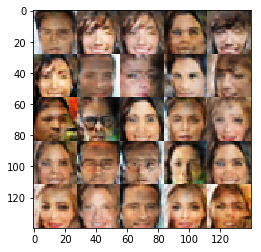

Step 6810... Epoch 7/10... Discriminator Loss: 0.7114... Generator Loss: 2.7692
Step 6820... Epoch 7/10... Discriminator Loss: 1.0654... Generator Loss: 1.2033
Step 6830... Epoch 7/10... Discriminator Loss: 0.8145... Generator Loss: 1.1292
Step 6840... Epoch 7/10... Discriminator Loss: 0.8665... Generator Loss: 1.3231
Step 6850... Epoch 7/10... Discriminator Loss: 0.7719... Generator Loss: 0.9353
Step 6860... Epoch 7/10... Discriminator Loss: 1.0852... Generator Loss: 0.6440
Step 6870... Epoch 7/10... Discriminator Loss: 0.6743... Generator Loss: 1.1348
Step 6880... Epoch 7/10... Discriminator Loss: 3.2019... Generator Loss: 5.2050
Step 6890... Epoch 7/10... Discriminator Loss: 0.7893... Generator Loss: 2.1517
Step 6900... Epoch 7/10... Discriminator Loss: 0.8443... Generator Loss: 0.9761


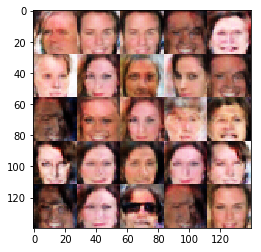

Step 6910... Epoch 7/10... Discriminator Loss: 0.7185... Generator Loss: 1.1618
Step 6920... Epoch 7/10... Discriminator Loss: 0.8562... Generator Loss: 0.8819
Step 6930... Epoch 7/10... Discriminator Loss: 1.6760... Generator Loss: 0.2955
Step 6940... Epoch 7/10... Discriminator Loss: 1.1617... Generator Loss: 0.5954
Step 6950... Epoch 7/10... Discriminator Loss: 1.1093... Generator Loss: 0.5973
Step 6960... Epoch 7/10... Discriminator Loss: 0.8616... Generator Loss: 0.9478
Step 6970... Epoch 7/10... Discriminator Loss: 1.0445... Generator Loss: 0.7042
Step 6980... Epoch 7/10... Discriminator Loss: 1.5992... Generator Loss: 0.3520
Step 6990... Epoch 7/10... Discriminator Loss: 1.1886... Generator Loss: 3.2468
Step 7000... Epoch 7/10... Discriminator Loss: 1.1461... Generator Loss: 3.1807


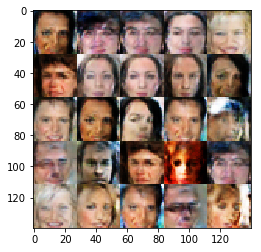

Step 7010... Epoch 7/10... Discriminator Loss: 1.6108... Generator Loss: 2.8518
Step 7020... Epoch 7/10... Discriminator Loss: 1.5338... Generator Loss: 0.4636
Step 7030... Epoch 7/10... Discriminator Loss: 0.7293... Generator Loss: 1.0205
Step 7040... Epoch 7/10... Discriminator Loss: 1.1110... Generator Loss: 0.5841
Step 7050... Epoch 7/10... Discriminator Loss: 1.2395... Generator Loss: 0.4611
Step 7060... Epoch 7/10... Discriminator Loss: 1.6806... Generator Loss: 0.2970
Step 7070... Epoch 7/10... Discriminator Loss: 1.1941... Generator Loss: 0.6008
Step 7080... Epoch 7/10... Discriminator Loss: 1.6421... Generator Loss: 0.3197
Step 7090... Epoch 8/10... Discriminator Loss: 1.6944... Generator Loss: 0.3094
Step 7100... Epoch 8/10... Discriminator Loss: 1.5089... Generator Loss: 0.3666


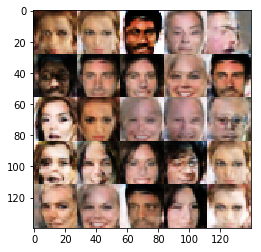

Step 7110... Epoch 8/10... Discriminator Loss: 1.3562... Generator Loss: 0.4654
Step 7120... Epoch 8/10... Discriminator Loss: 1.0027... Generator Loss: 2.4339
Step 7130... Epoch 8/10... Discriminator Loss: 0.8509... Generator Loss: 1.1486
Step 7140... Epoch 8/10... Discriminator Loss: 0.7610... Generator Loss: 1.1970
Step 7150... Epoch 8/10... Discriminator Loss: 0.7004... Generator Loss: 1.2636
Step 7160... Epoch 8/10... Discriminator Loss: 0.6145... Generator Loss: 1.7263
Step 7170... Epoch 8/10... Discriminator Loss: 1.2484... Generator Loss: 0.5051
Step 7180... Epoch 8/10... Discriminator Loss: 0.9706... Generator Loss: 0.8351
Step 7190... Epoch 8/10... Discriminator Loss: 1.2631... Generator Loss: 3.7183
Step 7200... Epoch 8/10... Discriminator Loss: 1.2542... Generator Loss: 0.6160


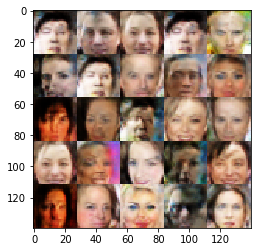

Step 7210... Epoch 8/10... Discriminator Loss: 0.8126... Generator Loss: 1.0129
Step 7220... Epoch 8/10... Discriminator Loss: 0.6424... Generator Loss: 1.5680
Step 7230... Epoch 8/10... Discriminator Loss: 0.8177... Generator Loss: 1.0149
Step 7240... Epoch 8/10... Discriminator Loss: 1.1206... Generator Loss: 0.5529
Step 7250... Epoch 8/10... Discriminator Loss: 2.1549... Generator Loss: 0.2001
Step 7260... Epoch 8/10... Discriminator Loss: 0.8465... Generator Loss: 2.8978
Step 7270... Epoch 8/10... Discriminator Loss: 0.9932... Generator Loss: 0.6623
Step 7280... Epoch 8/10... Discriminator Loss: 0.6458... Generator Loss: 2.3184
Step 7290... Epoch 8/10... Discriminator Loss: 0.7473... Generator Loss: 1.6420
Step 7300... Epoch 8/10... Discriminator Loss: 0.9845... Generator Loss: 2.5884


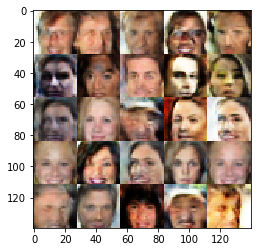

Step 7310... Epoch 8/10... Discriminator Loss: 0.8396... Generator Loss: 1.5762
Step 7320... Epoch 8/10... Discriminator Loss: 1.4889... Generator Loss: 3.8153
Step 7330... Epoch 8/10... Discriminator Loss: 0.9440... Generator Loss: 0.9356
Step 7340... Epoch 8/10... Discriminator Loss: 1.1355... Generator Loss: 0.5913
Step 7350... Epoch 8/10... Discriminator Loss: 1.3715... Generator Loss: 0.4094
Step 7360... Epoch 8/10... Discriminator Loss: 0.7219... Generator Loss: 1.1841
Step 7370... Epoch 8/10... Discriminator Loss: 0.6581... Generator Loss: 2.1692
Step 7380... Epoch 8/10... Discriminator Loss: 0.6689... Generator Loss: 2.0004
Step 7390... Epoch 8/10... Discriminator Loss: 0.9318... Generator Loss: 0.7901
Step 7400... Epoch 8/10... Discriminator Loss: 1.1741... Generator Loss: 0.5915


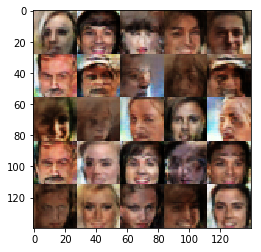

Step 7410... Epoch 8/10... Discriminator Loss: 2.1644... Generator Loss: 4.8085
Step 7420... Epoch 8/10... Discriminator Loss: 0.9433... Generator Loss: 0.8200
Step 7430... Epoch 8/10... Discriminator Loss: 0.6741... Generator Loss: 1.7625
Step 7440... Epoch 8/10... Discriminator Loss: 1.0671... Generator Loss: 0.6022
Step 7450... Epoch 8/10... Discriminator Loss: 0.8862... Generator Loss: 0.8273
Step 7460... Epoch 8/10... Discriminator Loss: 0.7353... Generator Loss: 1.2366
Step 7470... Epoch 8/10... Discriminator Loss: 1.2229... Generator Loss: 3.2509
Step 7480... Epoch 8/10... Discriminator Loss: 1.2687... Generator Loss: 3.5197
Step 7490... Epoch 8/10... Discriminator Loss: 1.5461... Generator Loss: 3.6734
Step 7500... Epoch 8/10... Discriminator Loss: 1.4102... Generator Loss: 0.4116


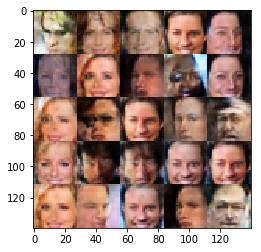

Step 7510... Epoch 8/10... Discriminator Loss: 0.6306... Generator Loss: 2.0086
Step 7520... Epoch 8/10... Discriminator Loss: 0.6482... Generator Loss: 2.1490
Step 7530... Epoch 8/10... Discriminator Loss: 0.7403... Generator Loss: 2.4630
Step 7540... Epoch 8/10... Discriminator Loss: 0.7906... Generator Loss: 1.0799
Step 7550... Epoch 8/10... Discriminator Loss: 0.8129... Generator Loss: 2.3674
Step 7560... Epoch 8/10... Discriminator Loss: 0.7634... Generator Loss: 0.8563
Step 7570... Epoch 8/10... Discriminator Loss: 0.8955... Generator Loss: 0.8282
Step 7580... Epoch 8/10... Discriminator Loss: 1.2340... Generator Loss: 0.5458
Step 7590... Epoch 8/10... Discriminator Loss: 1.2459... Generator Loss: 0.5223
Step 7600... Epoch 8/10... Discriminator Loss: 0.9083... Generator Loss: 0.8272


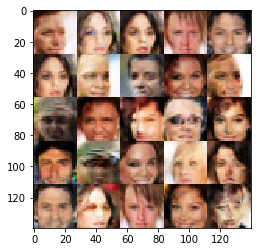

Step 7610... Epoch 8/10... Discriminator Loss: 1.0515... Generator Loss: 0.6269
Step 7620... Epoch 8/10... Discriminator Loss: 1.0429... Generator Loss: 0.6303
Step 7630... Epoch 8/10... Discriminator Loss: 1.3137... Generator Loss: 0.5308
Step 7640... Epoch 8/10... Discriminator Loss: 0.7894... Generator Loss: 0.9718
Step 7650... Epoch 8/10... Discriminator Loss: 0.9789... Generator Loss: 0.7356
Step 7660... Epoch 8/10... Discriminator Loss: 1.3998... Generator Loss: 0.4570
Step 7670... Epoch 8/10... Discriminator Loss: 1.2093... Generator Loss: 0.5500
Step 7680... Epoch 8/10... Discriminator Loss: 0.7332... Generator Loss: 2.4645
Step 7690... Epoch 8/10... Discriminator Loss: 1.1018... Generator Loss: 0.6026
Step 7700... Epoch 8/10... Discriminator Loss: 1.4517... Generator Loss: 0.4018


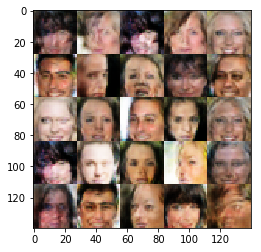

Step 7710... Epoch 8/10... Discriminator Loss: 1.1395... Generator Loss: 0.5793
Step 7720... Epoch 8/10... Discriminator Loss: 2.0077... Generator Loss: 0.2495
Step 7730... Epoch 8/10... Discriminator Loss: 0.8818... Generator Loss: 0.9081
Step 7740... Epoch 8/10... Discriminator Loss: 0.8845... Generator Loss: 1.7532
Step 7750... Epoch 8/10... Discriminator Loss: 0.7318... Generator Loss: 1.7035
Step 7760... Epoch 8/10... Discriminator Loss: 1.8450... Generator Loss: 0.3993
Step 7770... Epoch 8/10... Discriminator Loss: 1.6474... Generator Loss: 0.3290
Step 7780... Epoch 8/10... Discriminator Loss: 0.7625... Generator Loss: 1.0810
Step 7790... Epoch 8/10... Discriminator Loss: 0.8135... Generator Loss: 1.0656
Step 7800... Epoch 8/10... Discriminator Loss: 1.3083... Generator Loss: 0.7406


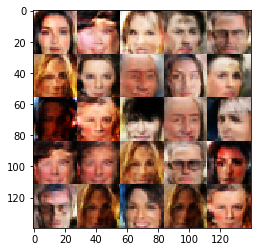

Step 7810... Epoch 8/10... Discriminator Loss: 1.5998... Generator Loss: 4.0113
Step 7820... Epoch 8/10... Discriminator Loss: 0.6168... Generator Loss: 1.3276
Step 7830... Epoch 8/10... Discriminator Loss: 0.7834... Generator Loss: 1.9936
Step 7840... Epoch 8/10... Discriminator Loss: 0.6722... Generator Loss: 1.3715
Step 7850... Epoch 8/10... Discriminator Loss: 0.5901... Generator Loss: 1.9299
Step 7860... Epoch 8/10... Discriminator Loss: 1.0611... Generator Loss: 0.6284
Step 7870... Epoch 8/10... Discriminator Loss: 0.9430... Generator Loss: 0.8030
Step 7880... Epoch 8/10... Discriminator Loss: 0.8135... Generator Loss: 0.9777
Step 7890... Epoch 8/10... Discriminator Loss: 1.6020... Generator Loss: 0.3396
Step 7900... Epoch 8/10... Discriminator Loss: 1.4494... Generator Loss: 0.4259


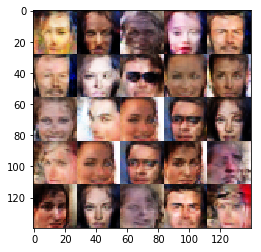

Step 7910... Epoch 8/10... Discriminator Loss: 0.9402... Generator Loss: 0.7812
Step 7920... Epoch 8/10... Discriminator Loss: 0.9549... Generator Loss: 0.7355
Step 7930... Epoch 8/10... Discriminator Loss: 0.7768... Generator Loss: 1.0796
Step 7940... Epoch 8/10... Discriminator Loss: 0.7156... Generator Loss: 1.5631
Step 7950... Epoch 8/10... Discriminator Loss: 0.8449... Generator Loss: 2.2770
Step 7960... Epoch 8/10... Discriminator Loss: 1.2187... Generator Loss: 0.5715
Step 7970... Epoch 8/10... Discriminator Loss: 1.2232... Generator Loss: 0.5450
Step 7980... Epoch 8/10... Discriminator Loss: 0.9235... Generator Loss: 0.8434
Step 7990... Epoch 8/10... Discriminator Loss: 1.2938... Generator Loss: 0.4667
Step 8000... Epoch 8/10... Discriminator Loss: 1.4019... Generator Loss: 0.5156


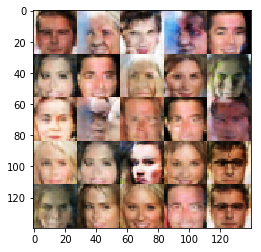

Step 8010... Epoch 8/10... Discriminator Loss: 1.1976... Generator Loss: 0.5038
Step 8020... Epoch 8/10... Discriminator Loss: 1.0106... Generator Loss: 0.7187
Step 8030... Epoch 8/10... Discriminator Loss: 0.6713... Generator Loss: 1.6641
Step 8040... Epoch 8/10... Discriminator Loss: 2.3882... Generator Loss: 5.1905
Step 8050... Epoch 8/10... Discriminator Loss: 2.0357... Generator Loss: 0.2241
Step 8060... Epoch 8/10... Discriminator Loss: 0.7176... Generator Loss: 1.1210
Step 8070... Epoch 8/10... Discriminator Loss: 1.2705... Generator Loss: 0.4805
Step 8080... Epoch 8/10... Discriminator Loss: 0.7096... Generator Loss: 1.1764
Step 8090... Epoch 8/10... Discriminator Loss: 1.0237... Generator Loss: 0.6857
Step 8100... Epoch 9/10... Discriminator Loss: 1.7767... Generator Loss: 0.3349


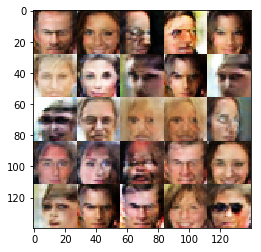

Step 8110... Epoch 9/10... Discriminator Loss: 0.7708... Generator Loss: 0.9138
Step 8120... Epoch 9/10... Discriminator Loss: 0.6981... Generator Loss: 1.0690
Step 8130... Epoch 9/10... Discriminator Loss: 2.0820... Generator Loss: 0.2678
Step 8140... Epoch 9/10... Discriminator Loss: 0.7593... Generator Loss: 2.5689
Step 8150... Epoch 9/10... Discriminator Loss: 0.9432... Generator Loss: 2.7999
Step 8160... Epoch 9/10... Discriminator Loss: 1.2251... Generator Loss: 3.7216
Step 8170... Epoch 9/10... Discriminator Loss: 0.8821... Generator Loss: 2.7604
Step 8180... Epoch 9/10... Discriminator Loss: 1.4503... Generator Loss: 3.8631
Step 8190... Epoch 9/10... Discriminator Loss: 0.6651... Generator Loss: 1.7295
Step 8200... Epoch 9/10... Discriminator Loss: 2.0803... Generator Loss: 0.2155


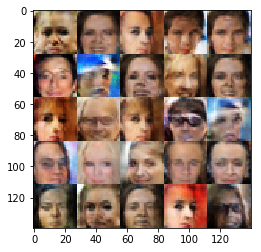

Step 8210... Epoch 9/10... Discriminator Loss: 0.8283... Generator Loss: 2.5872
Step 8220... Epoch 9/10... Discriminator Loss: 0.8101... Generator Loss: 1.0153
Step 8230... Epoch 9/10... Discriminator Loss: 1.2867... Generator Loss: 0.4789
Step 8240... Epoch 9/10... Discriminator Loss: 0.6015... Generator Loss: 1.8254
Step 8250... Epoch 9/10... Discriminator Loss: 0.5603... Generator Loss: 1.5808
Step 8260... Epoch 9/10... Discriminator Loss: 1.3357... Generator Loss: 0.4446
Step 8270... Epoch 9/10... Discriminator Loss: 1.4139... Generator Loss: 4.1932
Step 8280... Epoch 9/10... Discriminator Loss: 1.0441... Generator Loss: 0.6898
Step 8290... Epoch 9/10... Discriminator Loss: 1.1979... Generator Loss: 0.4977
Step 8300... Epoch 9/10... Discriminator Loss: 0.8441... Generator Loss: 0.8054


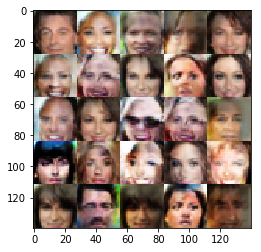

Step 8310... Epoch 9/10... Discriminator Loss: 0.6944... Generator Loss: 1.2735
Step 8320... Epoch 9/10... Discriminator Loss: 1.2358... Generator Loss: 0.5398
Step 8330... Epoch 9/10... Discriminator Loss: 0.8446... Generator Loss: 0.8269
Step 8340... Epoch 9/10... Discriminator Loss: 1.1617... Generator Loss: 0.5510
Step 8350... Epoch 9/10... Discriminator Loss: 0.6056... Generator Loss: 2.3731
Step 8360... Epoch 9/10... Discriminator Loss: 1.1075... Generator Loss: 3.3142
Step 8370... Epoch 9/10... Discriminator Loss: 0.7312... Generator Loss: 1.1063
Step 8380... Epoch 9/10... Discriminator Loss: 0.8893... Generator Loss: 2.8903
Step 8390... Epoch 9/10... Discriminator Loss: 1.4195... Generator Loss: 0.4224
Step 8400... Epoch 9/10... Discriminator Loss: 0.9732... Generator Loss: 0.6941


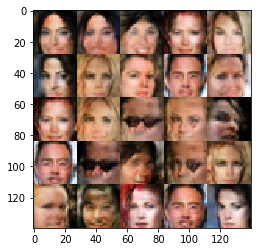

Step 8410... Epoch 9/10... Discriminator Loss: 1.0512... Generator Loss: 0.6275
Step 8420... Epoch 9/10... Discriminator Loss: 0.6143... Generator Loss: 2.8404
Step 8430... Epoch 9/10... Discriminator Loss: 1.3694... Generator Loss: 0.4959
Step 8440... Epoch 9/10... Discriminator Loss: 0.7134... Generator Loss: 1.0700
Step 8450... Epoch 9/10... Discriminator Loss: 1.4549... Generator Loss: 0.3989
Step 8460... Epoch 9/10... Discriminator Loss: 1.4918... Generator Loss: 0.3786
Step 8470... Epoch 9/10... Discriminator Loss: 0.7948... Generator Loss: 0.9088
Step 8480... Epoch 9/10... Discriminator Loss: 0.6485... Generator Loss: 2.9138
Step 8490... Epoch 9/10... Discriminator Loss: 1.6714... Generator Loss: 0.3591
Step 8500... Epoch 9/10... Discriminator Loss: 0.8092... Generator Loss: 3.4509


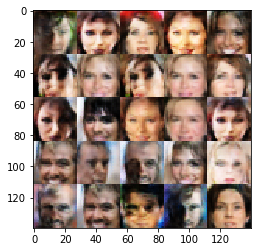

Step 8510... Epoch 9/10... Discriminator Loss: 1.3502... Generator Loss: 0.4398
Step 8520... Epoch 9/10... Discriminator Loss: 2.6814... Generator Loss: 0.1320
Step 8530... Epoch 9/10... Discriminator Loss: 1.2743... Generator Loss: 0.5130
Step 8540... Epoch 9/10... Discriminator Loss: 0.7385... Generator Loss: 1.1441
Step 8550... Epoch 9/10... Discriminator Loss: 1.0285... Generator Loss: 0.7625
Step 8560... Epoch 9/10... Discriminator Loss: 1.0641... Generator Loss: 0.6324
Step 8570... Epoch 9/10... Discriminator Loss: 1.5799... Generator Loss: 0.3437
Step 8580... Epoch 9/10... Discriminator Loss: 1.4222... Generator Loss: 0.3865
Step 8590... Epoch 9/10... Discriminator Loss: 0.6803... Generator Loss: 2.3768
Step 8600... Epoch 9/10... Discriminator Loss: 1.1289... Generator Loss: 0.5731


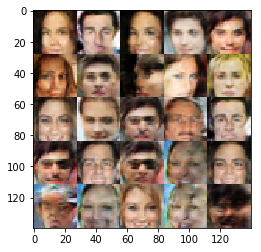

Step 8610... Epoch 9/10... Discriminator Loss: 0.8747... Generator Loss: 0.8298
Step 8620... Epoch 9/10... Discriminator Loss: 1.4468... Generator Loss: 0.4003
Step 8630... Epoch 9/10... Discriminator Loss: 0.7418... Generator Loss: 3.5769
Step 8640... Epoch 9/10... Discriminator Loss: 0.6024... Generator Loss: 3.1883
Step 8650... Epoch 9/10... Discriminator Loss: 1.5536... Generator Loss: 4.7934
Step 8660... Epoch 9/10... Discriminator Loss: 1.0252... Generator Loss: 3.5907
Step 8670... Epoch 9/10... Discriminator Loss: 2.2084... Generator Loss: 0.1839
Step 8680... Epoch 9/10... Discriminator Loss: 0.6132... Generator Loss: 1.7098
Step 8690... Epoch 9/10... Discriminator Loss: 1.9246... Generator Loss: 4.3373
Step 8700... Epoch 9/10... Discriminator Loss: 1.5222... Generator Loss: 0.3701


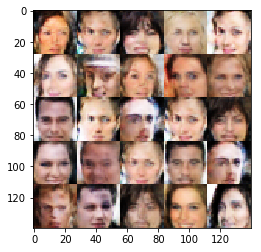

Step 8710... Epoch 9/10... Discriminator Loss: 0.9829... Generator Loss: 0.6986
Step 8720... Epoch 9/10... Discriminator Loss: 1.9431... Generator Loss: 0.2246
Step 8730... Epoch 9/10... Discriminator Loss: 0.8830... Generator Loss: 3.3358
Step 8740... Epoch 9/10... Discriminator Loss: 1.0300... Generator Loss: 0.6648
Step 8750... Epoch 9/10... Discriminator Loss: 0.7775... Generator Loss: 0.8191
Step 8760... Epoch 9/10... Discriminator Loss: 1.2507... Generator Loss: 0.5080
Step 8770... Epoch 9/10... Discriminator Loss: 0.7664... Generator Loss: 2.9567
Step 8780... Epoch 9/10... Discriminator Loss: 1.5493... Generator Loss: 0.4398
Step 8790... Epoch 9/10... Discriminator Loss: 1.6328... Generator Loss: 0.3633
Step 8800... Epoch 9/10... Discriminator Loss: 1.0852... Generator Loss: 0.6145


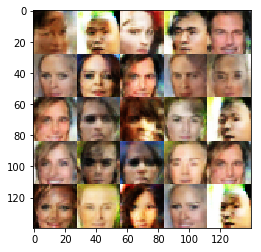

Step 8810... Epoch 9/10... Discriminator Loss: 1.1671... Generator Loss: 0.6025
Step 8820... Epoch 9/10... Discriminator Loss: 0.5800... Generator Loss: 2.8027
Step 8830... Epoch 9/10... Discriminator Loss: 0.7296... Generator Loss: 1.2099
Step 8840... Epoch 9/10... Discriminator Loss: 1.2369... Generator Loss: 0.5484
Step 8850... Epoch 9/10... Discriminator Loss: 0.6407... Generator Loss: 1.2064
Step 8860... Epoch 9/10... Discriminator Loss: 0.6343... Generator Loss: 1.6793
Step 8870... Epoch 9/10... Discriminator Loss: 1.3384... Generator Loss: 0.4552
Step 8880... Epoch 9/10... Discriminator Loss: 0.9254... Generator Loss: 0.7203
Step 8890... Epoch 9/10... Discriminator Loss: 0.6347... Generator Loss: 2.2888
Step 8900... Epoch 9/10... Discriminator Loss: 1.1085... Generator Loss: 4.0546


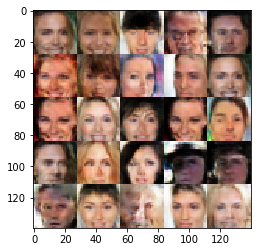

Step 8910... Epoch 9/10... Discriminator Loss: 1.1637... Generator Loss: 0.5872
Step 8920... Epoch 9/10... Discriminator Loss: 0.7122... Generator Loss: 1.1954
Step 8930... Epoch 9/10... Discriminator Loss: 0.6483... Generator Loss: 1.4025
Step 8940... Epoch 9/10... Discriminator Loss: 1.2344... Generator Loss: 0.5165
Step 8950... Epoch 9/10... Discriminator Loss: 2.1512... Generator Loss: 0.2086
Step 8960... Epoch 9/10... Discriminator Loss: 0.7159... Generator Loss: 1.1526
Step 8970... Epoch 9/10... Discriminator Loss: 0.5482... Generator Loss: 1.2597
Step 8980... Epoch 9/10... Discriminator Loss: 1.1701... Generator Loss: 4.2008
Step 8990... Epoch 9/10... Discriminator Loss: 1.0554... Generator Loss: 3.9816
Step 9000... Epoch 9/10... Discriminator Loss: 1.8332... Generator Loss: 0.2761


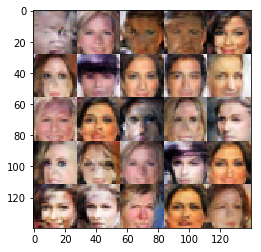

Step 9010... Epoch 9/10... Discriminator Loss: 0.6480... Generator Loss: 1.3685
Step 9020... Epoch 9/10... Discriminator Loss: 1.0922... Generator Loss: 0.6889
Step 9030... Epoch 9/10... Discriminator Loss: 0.7926... Generator Loss: 0.8769
Step 9040... Epoch 9/10... Discriminator Loss: 0.6670... Generator Loss: 2.5015
Step 9050... Epoch 9/10... Discriminator Loss: 1.3915... Generator Loss: 0.4365
Step 9060... Epoch 9/10... Discriminator Loss: 1.3893... Generator Loss: 0.5217
Step 9070... Epoch 9/10... Discriminator Loss: 0.9017... Generator Loss: 3.1772
Step 9080... Epoch 9/10... Discriminator Loss: 1.4602... Generator Loss: 4.4742
Step 9090... Epoch 9/10... Discriminator Loss: 0.8871... Generator Loss: 2.7492
Step 9100... Epoch 9/10... Discriminator Loss: 0.6643... Generator Loss: 1.9421


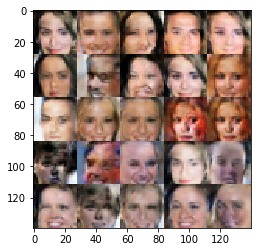

Step 9110... Epoch 10/10... Discriminator Loss: 0.5866... Generator Loss: 1.8265
Step 9120... Epoch 10/10... Discriminator Loss: 0.9275... Generator Loss: 3.4005
Step 9130... Epoch 10/10... Discriminator Loss: 0.6613... Generator Loss: 2.3573
Step 9140... Epoch 10/10... Discriminator Loss: 0.3969... Generator Loss: 2.3216
Step 9150... Epoch 10/10... Discriminator Loss: 0.8615... Generator Loss: 0.9188
Step 9160... Epoch 10/10... Discriminator Loss: 1.9780... Generator Loss: 0.2373
Step 9170... Epoch 10/10... Discriminator Loss: 0.8647... Generator Loss: 0.8336
Step 9180... Epoch 10/10... Discriminator Loss: 0.8718... Generator Loss: 0.7208
Step 9190... Epoch 10/10... Discriminator Loss: 0.6943... Generator Loss: 2.5271
Step 9200... Epoch 10/10... Discriminator Loss: 0.5897... Generator Loss: 3.5901


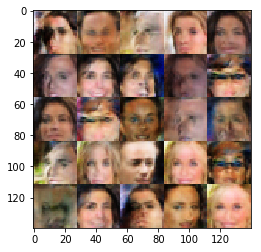

Step 9210... Epoch 10/10... Discriminator Loss: 1.0083... Generator Loss: 0.6329
Step 9220... Epoch 10/10... Discriminator Loss: 0.6719... Generator Loss: 1.1285
Step 9230... Epoch 10/10... Discriminator Loss: 0.8833... Generator Loss: 0.7551
Step 9240... Epoch 10/10... Discriminator Loss: 0.6008... Generator Loss: 2.3151
Step 9250... Epoch 10/10... Discriminator Loss: 0.9402... Generator Loss: 3.6554
Step 9260... Epoch 10/10... Discriminator Loss: 0.6127... Generator Loss: 1.1638
Step 9270... Epoch 10/10... Discriminator Loss: 0.5067... Generator Loss: 2.3151
Step 9280... Epoch 10/10... Discriminator Loss: 0.4609... Generator Loss: 2.5624
Step 9290... Epoch 10/10... Discriminator Loss: 1.2539... Generator Loss: 4.0889
Step 9300... Epoch 10/10... Discriminator Loss: 0.5507... Generator Loss: 1.5018


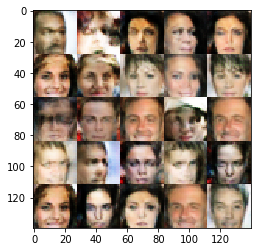

Step 9310... Epoch 10/10... Discriminator Loss: 1.3116... Generator Loss: 4.5628
Step 9320... Epoch 10/10... Discriminator Loss: 1.1155... Generator Loss: 0.6117
Step 9330... Epoch 10/10... Discriminator Loss: 1.1264... Generator Loss: 0.6487
Step 9340... Epoch 10/10... Discriminator Loss: 0.9023... Generator Loss: 0.8464
Step 9350... Epoch 10/10... Discriminator Loss: 1.2085... Generator Loss: 0.5333
Step 9360... Epoch 10/10... Discriminator Loss: 0.8562... Generator Loss: 0.7610
Step 9370... Epoch 10/10... Discriminator Loss: 0.5402... Generator Loss: 1.6355
Step 9380... Epoch 10/10... Discriminator Loss: 0.5554... Generator Loss: 2.1174
Step 9390... Epoch 10/10... Discriminator Loss: 0.5115... Generator Loss: 1.7865
Step 9400... Epoch 10/10... Discriminator Loss: 0.7353... Generator Loss: 3.0101


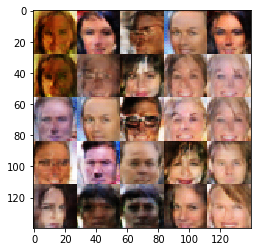

Step 9410... Epoch 10/10... Discriminator Loss: 0.8347... Generator Loss: 4.0958
Step 9420... Epoch 10/10... Discriminator Loss: 0.5647... Generator Loss: 2.7647
Step 9430... Epoch 10/10... Discriminator Loss: 0.7304... Generator Loss: 0.9747
Step 9440... Epoch 10/10... Discriminator Loss: 1.3622... Generator Loss: 0.4631
Step 9450... Epoch 10/10... Discriminator Loss: 1.8410... Generator Loss: 0.3819
Step 9460... Epoch 10/10... Discriminator Loss: 0.7114... Generator Loss: 3.0368
Step 9470... Epoch 10/10... Discriminator Loss: 0.7449... Generator Loss: 1.1285
Step 9480... Epoch 10/10... Discriminator Loss: 1.1103... Generator Loss: 3.5135
Step 9490... Epoch 10/10... Discriminator Loss: 1.1967... Generator Loss: 0.6499
Step 9500... Epoch 10/10... Discriminator Loss: 0.7629... Generator Loss: 2.2572


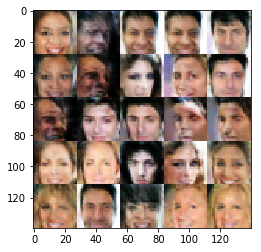

Step 9510... Epoch 10/10... Discriminator Loss: 0.9700... Generator Loss: 0.6891
Step 9520... Epoch 10/10... Discriminator Loss: 0.8166... Generator Loss: 1.1731
Step 9530... Epoch 10/10... Discriminator Loss: 1.0393... Generator Loss: 0.6475
Step 9540... Epoch 10/10... Discriminator Loss: 1.6106... Generator Loss: 4.1504
Step 9550... Epoch 10/10... Discriminator Loss: 1.6705... Generator Loss: 0.3722
Step 9560... Epoch 10/10... Discriminator Loss: 1.7427... Generator Loss: 0.4065
Step 9570... Epoch 10/10... Discriminator Loss: 1.0244... Generator Loss: 4.7050
Step 9580... Epoch 10/10... Discriminator Loss: 0.5225... Generator Loss: 2.2754
Step 9590... Epoch 10/10... Discriminator Loss: 0.7657... Generator Loss: 0.9804
Step 9600... Epoch 10/10... Discriminator Loss: 0.7782... Generator Loss: 0.9651


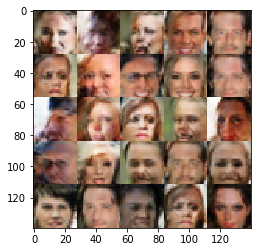

Step 9610... Epoch 10/10... Discriminator Loss: 2.2173... Generator Loss: 0.1993
Step 9620... Epoch 10/10... Discriminator Loss: 0.4905... Generator Loss: 2.4092
Step 9630... Epoch 10/10... Discriminator Loss: 1.4150... Generator Loss: 0.5020
Step 9640... Epoch 10/10... Discriminator Loss: 1.3284... Generator Loss: 3.6649
Step 9650... Epoch 10/10... Discriminator Loss: 0.6568... Generator Loss: 1.0992
Step 9660... Epoch 10/10... Discriminator Loss: 0.6302... Generator Loss: 1.9814
Step 9670... Epoch 10/10... Discriminator Loss: 2.1623... Generator Loss: 0.2217
Step 9680... Epoch 10/10... Discriminator Loss: 0.4895... Generator Loss: 1.9827
Step 9690... Epoch 10/10... Discriminator Loss: 0.6403... Generator Loss: 2.8746
Step 9700... Epoch 10/10... Discriminator Loss: 0.5415... Generator Loss: 1.6274


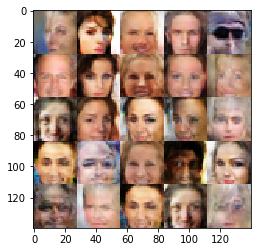

Step 9710... Epoch 10/10... Discriminator Loss: 1.4647... Generator Loss: 0.4498
Step 9720... Epoch 10/10... Discriminator Loss: 0.4729... Generator Loss: 2.4089
Step 9730... Epoch 10/10... Discriminator Loss: 0.5370... Generator Loss: 2.0646
Step 9740... Epoch 10/10... Discriminator Loss: 0.7609... Generator Loss: 3.2899
Step 9750... Epoch 10/10... Discriminator Loss: 1.2997... Generator Loss: 0.5500
Step 9760... Epoch 10/10... Discriminator Loss: 0.6864... Generator Loss: 1.2413
Step 9770... Epoch 10/10... Discriminator Loss: 1.0080... Generator Loss: 4.7588
Step 9780... Epoch 10/10... Discriminator Loss: 0.6558... Generator Loss: 1.2415
Step 9790... Epoch 10/10... Discriminator Loss: 0.7040... Generator Loss: 1.2073
Step 9800... Epoch 10/10... Discriminator Loss: 0.5994... Generator Loss: 1.2435


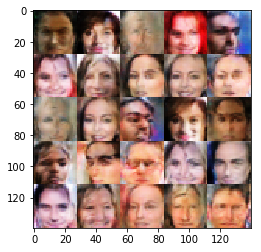

Step 9810... Epoch 10/10... Discriminator Loss: 1.6480... Generator Loss: 0.4532
Step 9820... Epoch 10/10... Discriminator Loss: 0.6393... Generator Loss: 1.2255
Step 9830... Epoch 10/10... Discriminator Loss: 0.6510... Generator Loss: 2.7696
Step 9840... Epoch 10/10... Discriminator Loss: 0.7409... Generator Loss: 1.5266
Step 9850... Epoch 10/10... Discriminator Loss: 2.3146... Generator Loss: 0.1904
Step 9860... Epoch 10/10... Discriminator Loss: 1.1184... Generator Loss: 0.6058
Step 9870... Epoch 10/10... Discriminator Loss: 0.8086... Generator Loss: 0.8534
Step 9880... Epoch 10/10... Discriminator Loss: 1.5855... Generator Loss: 4.3509
Step 9890... Epoch 10/10... Discriminator Loss: 0.4997... Generator Loss: 3.0792
Step 9900... Epoch 10/10... Discriminator Loss: 2.1093... Generator Loss: 0.2609


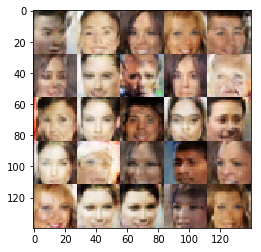

Step 9910... Epoch 10/10... Discriminator Loss: 1.0973... Generator Loss: 0.5921
Step 9920... Epoch 10/10... Discriminator Loss: 0.5963... Generator Loss: 1.9426
Step 9930... Epoch 10/10... Discriminator Loss: 0.6249... Generator Loss: 1.7025
Step 9940... Epoch 10/10... Discriminator Loss: 0.8488... Generator Loss: 4.1641
Step 9950... Epoch 10/10... Discriminator Loss: 0.5524... Generator Loss: 3.1121
Step 9960... Epoch 10/10... Discriminator Loss: 1.4586... Generator Loss: 5.9641
Step 9970... Epoch 10/10... Discriminator Loss: 0.7363... Generator Loss: 0.9149
Step 9980... Epoch 10/10... Discriminator Loss: 0.7391... Generator Loss: 3.3757
Step 9990... Epoch 10/10... Discriminator Loss: 0.4699... Generator Loss: 2.2702
Step 10000... Epoch 10/10... Discriminator Loss: 0.8752... Generator Loss: 0.7959


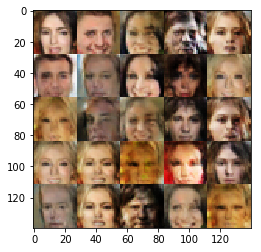

Step 10010... Epoch 10/10... Discriminator Loss: 0.6911... Generator Loss: 1.0473
Step 10020... Epoch 10/10... Discriminator Loss: 0.8629... Generator Loss: 4.5653
Step 10030... Epoch 10/10... Discriminator Loss: 2.2633... Generator Loss: 5.5586
Step 10040... Epoch 10/10... Discriminator Loss: 0.4125... Generator Loss: 1.9459
Step 10050... Epoch 10/10... Discriminator Loss: 0.7968... Generator Loss: 0.9159
Step 10060... Epoch 10/10... Discriminator Loss: 1.5317... Generator Loss: 4.4160
Step 10070... Epoch 10/10... Discriminator Loss: 0.4396... Generator Loss: 2.0619
Step 10080... Epoch 10/10... Discriminator Loss: 0.7937... Generator Loss: 0.8281
Step 10090... Epoch 10/10... Discriminator Loss: 0.5454... Generator Loss: 1.5023
Step 10100... Epoch 10/10... Discriminator Loss: 0.6037... Generator Loss: 1.4327


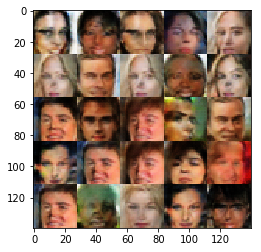

Step 10110... Epoch 10/10... Discriminator Loss: 1.0949... Generator Loss: 0.7443
Step 10120... Epoch 10/10... Discriminator Loss: 0.6370... Generator Loss: 1.1295


In [125]:
batch_size = 200
z_dim = 256
learning_rate = 0.002 
beta1 = 0.3



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.

In [128]:
#Trying to reuse Generator without success

# cmap = None
# input_z = tf.placeholder(tf.float32, (None, 256), name = 'z_input')

# z_dim = input_z.get_shape().as_list()[-1]

# example_z = np.random.uniform(-1, 1, size=[16, z_dim])

# with tf.Session() as sess:
#     samples = sess.run(
#         generator(input_z, 3, False),
#         feed_dict={input_z: example_z})

# images_grid = helper.images_square_grid(samples, celeba_dataset.image_mode)
# pyplot.imshow(images_grid, cmap=cmap)
# pyplot.show()